#MIT License
Copyright (c) 2023 Lokesh Mohan Jeswani

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

##Abstarct

My goal is to interpret several song popularity prediction models used on Spotify, such as linear models, tree-based models, and the top model found via auto ml. The models are interpreted using the SHAP analysis, and their interpretability is contrasted with that of other methodologies. In light of the Spotify dataset, the goal is to learn more about the models and their prediction ability.

# Dataset Characteristics
1. Dataset consists of 223 records and has 18 features like tempo, liveliness, acousticness and speechness and various other tune characteristics.
2. Track_Popularity : Song rating based on the audience consumption of songs on the platform.
3. Dancability : Dancability describes how much the track is suitable for dance(more thumping beats) 0.0(least) - 1.0(highest).
4. Energy : Energy is again measured on the scale of 0.0 to 0.1 and represents the measure of energy in track(eg. fast and noisy).
5. loudness : the overall loudness of a track in decibels(-60 to 0 is the scale in detect the pitch of the tune).
6. Speechiness : speechiness indicated the vocal talk show (for eg: podcasts on streaming services) [Scale 0.33 to 0.66] - 0.33 is more likely music and no speech, less speech will indicate more intrumentalness and vice versa.
7. Acousticness : A measure from 0.0 to 1.0 of whether the track is acoustics, represents the feature of the song(if its acoustic or melodious).
8. Instrumentalness : no presence of vocals in the tune. (0.8 measure indicated the strong indication that the track is less vocals).
9. Liveness : Detects the presence of audience (eg. concert).
10. Valence : measuring the positivity of music on the scale of 0.0 to 1.0[high valence indicated more positivity].
11. Tempo : Tempo of the track indicated the beats per minute(BPM), more the beats , more is the pace of music.
12. Time Signature : estimate duration of track.
13. duration_ms : duration of track in milliseconds

In [54]:
# Importing all libraries necessary for the assignment
!pip install shap
!pip install lime
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install pydot
import pandas as pd
import numpy as np
import shap
import lime
import sklearn
from lime import lime_tabular
from sklearn.model_selection import train_test_split
import random
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns

plt.rcParams["figure.figsize"] = (32, 24)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [55]:
min_mem_size = 6
run_time = 222

In [56]:
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

3


In [57]:
port_no = random.randint(5555, 55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) 
## start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:23878..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpq3mm1jhi
  JVM stdout: /tmp/tmpq3mm1jhi/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpq3mm1jhi/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:23878
Connecting to H2O server at http://127.0.0.1:23878 ... successful.


H2O_cluster_uptime:,05 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.2
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_0q9gj5
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [58]:
ttdata = pd.read_csv("https://raw.githubusercontent.com/Jeswani-Lokesh/DSEM---INFO6105/main/ttdata.csv")


In [59]:
ttdata.head()

,track_name,artist_name,artist_pop,album,track_pop,danceability,energy,loudness,mode,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration_ms,popular
0,Shake It,Metro Station,53,Metro Station,68,0.618,0.955,-3.836,1,4,0.0798,0.00221,0.000003,0.486,0.790,150.034,4,179947,1
1,Chinese New Year,SALES,61,SALES - EP,53,0.744,0.845,-7.422,0,4,0.2530,0.75900,0.232000,0.100,0.749,75.221,4,160000,0
2,Baby I'm Yours,Breakbot,57,By Your Side,69,0.829,0.792,-3.755,0,2,0.0668,0.72600,0.000006,0.122,0.758,118.050,4,215507,1
3,The Git Up,Blanco Brown,60,The Git Up,2,0.847,0.678,-8.635,1,9,0.1090,0.06690,0.000000,0.274,0.811,97.984,4,200594,0
4,Say Hey (I Love You),Michael Franti & Spearhead,58,All Rebel Rockers,0,0.738,0.983,-4.374,0,5,0.0855,0.03800,0.000006,0.183,0.957,92.998,4,235760,0


In [60]:
num_cols = ttdata._get_numeric_data().columns
num_cols, len(num_cols)

(Index(['artist_pop', 'track_pop', 'danceability', 'energy', 'loudness', 'mode',
        'key', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
        'valence', 'tempo', 'time_signature', 'duration_ms', 'popular'],
       dtype='object'),
 16)

In [61]:
cat_cols = ttdata.select_dtypes(include=['object']).columns.tolist()
cat_cols, len(cat_cols)

(['track_name', 'artist_name', 'album'], 3)

In [62]:
ttdata.drop('track_name', axis=1 , inplace=True)
ttdata.drop('artist_name', axis=1, inplace=True)
ttdata.drop('album', axis=1 , inplace=True)
ttdata.drop('track_pop', axis=1, inplace=True)

In [63]:
ttdata.head()

,artist_pop,danceability,energy,loudness,mode,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration_ms,popular
0,53,0.618,0.955,-3.836,1,4,0.0798,0.00221,0.000003,0.486,0.790,150.034,4,179947,1
1,61,0.744,0.845,-7.422,0,4,0.2530,0.75900,0.232000,0.100,0.749,75.221,4,160000,0
2,57,0.829,0.792,-3.755,0,2,0.0668,0.72600,0.000006,0.122,0.758,118.050,4,215507,1
3,60,0.847,0.678,-8.635,1,9,0.1090,0.06690,0.000000,0.274,0.811,97.984,4,200594,0
4,58,0.738,0.983,-4.374,0,5,0.0855,0.03800,0.000006,0.183,0.957,92.998,4,235760,0


In [64]:
X = ttdata.drop(["popular"], axis=1)  # Training Feature
Y = ttdata["popular"]  # Target

In [65]:
(
    x_train,
    x_test,
    y_train,
    y_test,
) = train_test_split(  # Splitting Data into Training and Test
    X, Y, test_size=0.1, random_state=42
)
x_train_100 = shap.utils.sample(
    x_train, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process
x_test_100 = shap.utils.sample(
    x_test, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process

#Fitting a Linear Model

In [66]:
linear_model = sklearn.linear_model.LinearRegression()  # Initializing a Linear Model
linear_model.fit(x_train, y_train)  # Training a linear model

LinearRegression()

In [67]:
# Scaling the data using Min-Max scaling for the purpose of evaluating Co-efficients, as non scaled data may mislead while we evaluate the co-efficients
df = ttdata.drop("popular", axis=1)
df_norm = (df - df.min()) / (df.max() - df.min())
df_norm = pd.concat((df_norm, ttdata.popular), 1)

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.


In [68]:
import statsmodels.formula.api as smf  # OLS model Library

results = smf.ols(
    "popular ~ duration_ms +	acousticness +	danceability +	energy + instrumentalness +	key	+ liveness +	loudness +	mode +	speechiness +	tempo +	time_signature +	valence	",
    data=df_norm,
).fit()
print(results.summary())  # OLS Linear Model Summary

                            OLS Regression Results                            
Dep. Variable:                popular   R-squared:                       0.130
Model:                            OLS   Adj. R-squared:                  0.076
Method:                 Least Squares   F-statistic:                     2.411
Date:                Thu, 30 Mar 2023   Prob (F-statistic):            0.00477
Time:                        03:33:15   Log-Likelihood:                -133.63
No. Observations:                 223   AIC:                             295.3
Df Residuals:                     209   BIC:                             343.0
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            0.2541      0.416  

#Interpreting Regression Co-efficients
#  Model Co-efficients
The table's mixture of positive and negative coefficients indicates that some predictors and the target variable (popularity) have positive and negative correlations, respectively. The size of the coefficients also reveals the degree of correlation; higher coefficients suggest a more significant relationship between the predictor and the outcome variable. It is crucial to remember that the context of the dataset and the modeling strategy used may affect how the coefficients are interpreted.

Value for the variable Loudness is highest = 0.5901

Coefficients with high absolute values can be used to estimate how significant a given variable is in a linear regression. Here, as mentioned previously, Loudness appears to be the most crucial factor in predicting the track's popularity.

Also, it means that the likelihood of a track being popular increases with increasing levels of volume and liveness.

P-Values:


If the p-value is 0.05 or lower, the result is hailed as significant; but, if it is higher than 0.05, the result is non-significant.

key
liveness
mode

These factors have a P-Value of less than 0.05, which indicates that they are significant variables and that any alteration to these variables will have a big impact on the popularity of the song.

Skew and Kurtosis:


Kurtosis provides information on the sharpness and height of the central peak. Skewness describes the amount and direction of skew (departure from the central axis). The ideal result for these two measurements is 0, but in our situation, Skew and Kurtosis have values 0.516 and 1.735.

Durbin-Watson:


The Durbin-Watson test is a statistical method for identifying auto-correlation in the regression analysis' residuals. It falls between 0 and 4.

Value 2 denotes the absence of any autocorrelation.
Value between 0 and 2 denotes the presence of positive autocorrelation.
Values between 2 and 4 denote the presence of negative autocorrelation.
Our model has a DW score of 1.899, which indicates positive auto-correlation in the residuals of regression.

Jarque-Bera Test:


Whether the data have skew or kurtosis, the JB test is referred to as the test of normality. The data do not have a normal distribution if it is far from zero. Our JB value, which is 24.772, confirms the meaning Skew and Kurtosis gave us.

# Fit Tree Based Model


In [69]:
tree_model = RandomForestRegressor(max_depth=3, random_state=0, n_estimators=10)
tree_model.fit(x_train, y_train)

RandomForestRegressor(max_depth=3, n_estimators=10, random_state=0)

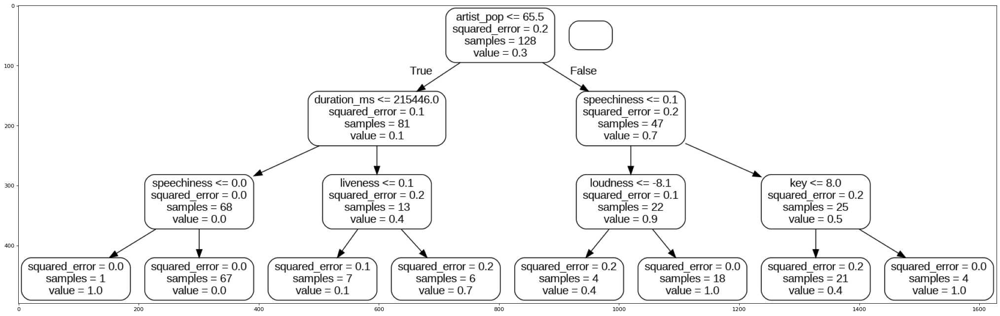

In [70]:
figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(x_train.columns),
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

# Interpreting Nodes of a Tree-Based Model

A Random Forest Regressor is a machine learning model that makes use of many decision trees to forecast the target variable by averaging their individual forecasts. The model's decision trees each have criteria on their internal nodes and a value assigned to their leaf nodes, which is the anticipated value. The internal nodes likewise have a value that corresponds to the mean of the response variables in the area delineated by the condition of that node.

In [71]:
tree_importances = list(tree_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(x_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [72]:
[print("Variable: {:20} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: artist_pop           Importance: 0.6
Variable: speechiness          Importance: 0.09
Variable: danceability         Importance: 0.05
Variable: duration_ms          Importance: 0.05
Variable: liveness             Importance: 0.04
Variable: tempo                Importance: 0.04
Variable: acousticness         Importance: 0.03
Variable: instrumentalness     Importance: 0.03
Variable: energy               Importance: 0.02
Variable: loudness             Importance: 0.02
Variable: key                  Importance: 0.02
Variable: mode                 Importance: 0.0
Variable: valence              Importance: 0.0
Variable: time_signature       Importance: 0.0


# Getting best model using H2O AutoML


In [73]:
ttdata_hf = h2o.H2OFrame(ttdata)  # Converting Pandas dataframe in H2O dataframe

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [74]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = ttdata_hf.split_frame([pct_rows])

In [75]:
def autoML(df_train, df_test):
    X = df_train.columns
    y = "popular"

    X.remove(y)  # Removing the result frm our predictors data

    aml = H2OAutoML(max_runtime_secs=222, seed=1)  # Setting of AutoML
    aml.train(
        x=X, y=y, training_frame=df_train
    )  # Trainig the dataset on different models

    return df_train, df_test, aml


# Function to get best model from the AutoML leaderboard
def getBestModel(aml):
    model_index = 0
    glm_index = 0
    glm_model = ""
    aml_leaderboard_df = aml.leaderboard.as_data_frame()
    models_dict = {}

    for m in aml_leaderboard_df["model_id"]:
        models_dict[m] = model_index
        if "StackedEnsemble" not in m:
            break
        model_index = model_index + 1

    for m in aml_leaderboard_df["model_id"]:
        if "GLM" in m:
            models_dict[m] = glm_index
            break
        glm_index = glm_index + 1

    print(model_index)
    best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])
    return best_model
     

In [76]:
autoML = autoML(df_train, df_test)  # Training AutoML

AutoML progress: |
03:33:22.469: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█
03:33:26.950: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█
03:33:28.475: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
03:33:28.475: _min_rows param, The dataset size is too small to split for min_rows=100.0: must have at least 200.0 (weighted) rows, but have only 180.0.
03:33:28.516: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train

In [77]:
autoML[2].leaderboard  #Leaderbord of AutoML output

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
XGBoost_grid_1_AutoML_1_20230330_33322_model_20,0.409959,0.168066,0.337605,0.286892,0.168066
XGBoost_grid_1_AutoML_1_20230330_33322_model_15,0.413061,0.170619,0.334776,0.28996,0.170619
XGBoost_grid_1_AutoML_1_20230330_33322_model_28,0.413136,0.170681,0.348035,0.290959,0.170681
XGBoost_grid_1_AutoML_1_20230330_33322_model_19,0.414207,0.171567,0.34533,0.2907,0.171567
GBM_3_AutoML_1_20230330_33322,0.415289,0.172465,0.33747,0.291057,0.172465
XGBoost_grid_1_AutoML_1_20230330_33322_model_47,0.415645,0.172761,0.354207,0.291625,0.172761
StackedEnsemble_BestOfFamily_3_AutoML_1_20230330_33322,0.41574,0.17284,0.348207,0.292452,0.17284
XGBoost_grid_1_AutoML_1_20230330_33322_model_49,0.416073,0.173117,0.340297,0.292912,0.173117
StackedEnsemble_BestOfFamily_4_AutoML_1_20230330_33322,0.416526,0.173494,0.343249,0.292662,0.173494
XGBoost_grid_1_AutoML_1_20230330_33322_model_56,0.417492,0.1743,0.345999,0.293133,0.1743


In [78]:
autoML_model = getBestModel(autoML[2])  # Getting Best Model
print(autoML_model)

0
Model Details
H2OXGBoostEstimator : XGBoost
Model Key: XGBoost_grid_1_AutoML_1_20230330_33322_model_20


Model Summary: 
    number_of_trees
--  -----------------
    36

ModelMetricsRegression: xgboost
** Reported on train data. **

MSE: 0.0818781394670793
RMSE: 0.2861435644341478
MAE: 0.2267672982480791
RMSLE: 0.20198417262391358
Mean Residual Deviance: 0.0818781394670793

ModelMetricsRegression: xgboost
** Reported on cross-validation data. **

MSE: 0.16806599240368955
RMSE: 0.4099585252238201
MAE: 0.33760471360550987
RMSLE: 0.2868919527748976
Mean Residual Deviance: 0.16806599240368955

Cross-Validation Metrics Summary: 
                        mean      sd         cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  --------  ---------  ------------  ------------  ------------  ------------  ------------
mae                     0.337605  0.0474398  0.275869      0.385775      0.299418      0.369523      0.357438
mean_residual_deviance  0.168

In [79]:
autoML_model.predict

<bound method ModelBase.predict of H2OXGBoostEstimator({'parms': {'model_id': {'__meta': {'schema_version': 3, 'schema_name': 'ModelParameterSchemaV3', 'schema_type': 'Iced'}, 'name': 'model_id', 'label': 'model_id', 'help': 'Destination id for this model; auto-generated if not specified.', 'required': False, 'type': 'Key<Model>', 'default_value': None, 'actual_value': {'__meta': {'schema_version': 3, 'schema_name': 'ModelKeyV3', 'schema_type': 'Key<Model>'}, 'name': 'XGBoost_grid_1_AutoML_1_20230330_33322_model_20', 'type': 'Key<Model>', 'URL': '/3/Models/XGBoost_grid_1_AutoML_1_20230330_33322_model_20'}, 'input_value': None, 'level': 'critical', 'values': [], 'is_member_of_frames': [], 'is_mutually_exclusive_with': [], 'gridable': False}, 'training_frame': {'__meta': {'schema_version': 3, 'schema_name': 'ModelParameterSchemaV3', 'schema_type': 'Iced'}, 'name': 'training_frame', 'label': 'training_frame', 'help': 'Id of the training data frame.', 'required': False, 'type': 'Key<Frame>

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

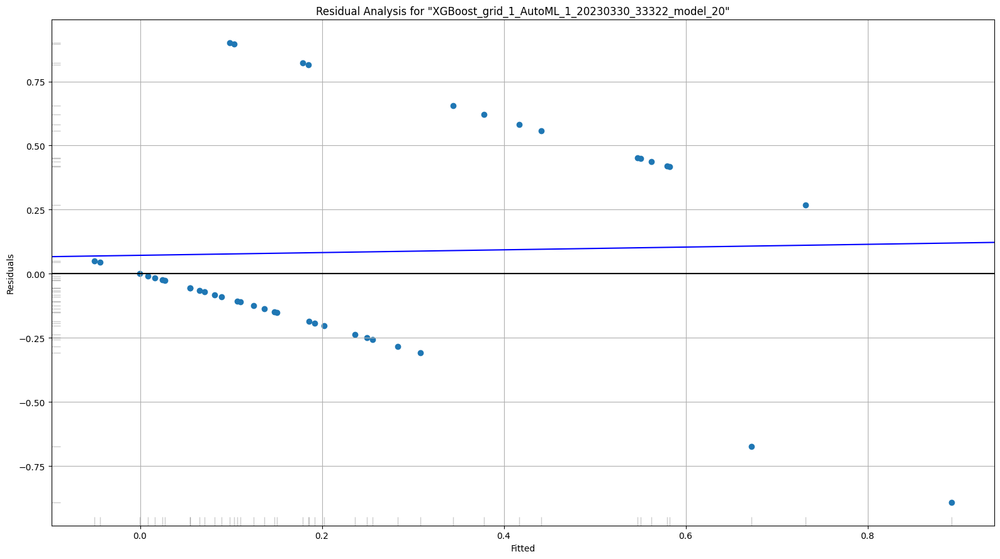

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

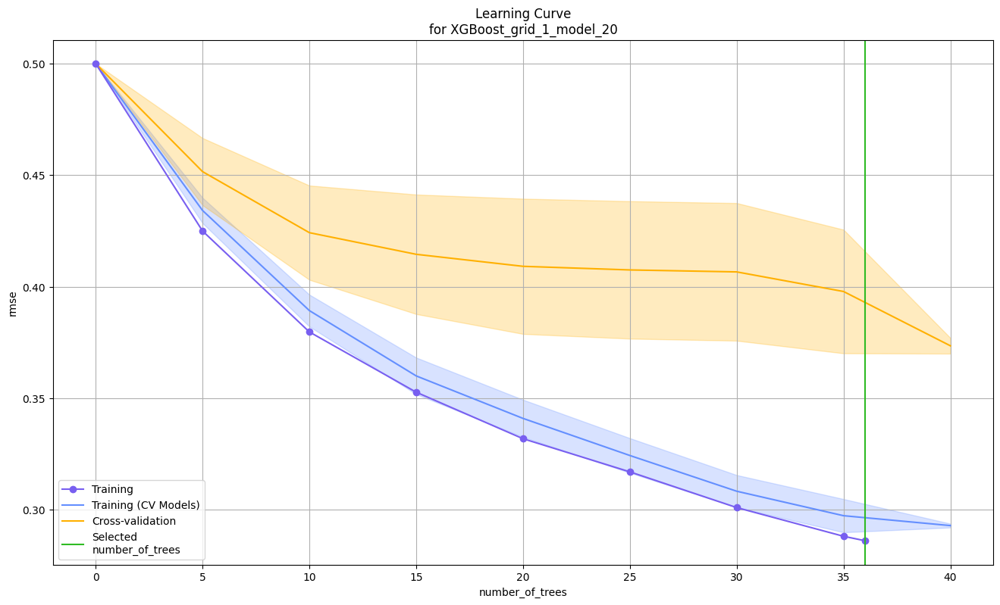

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

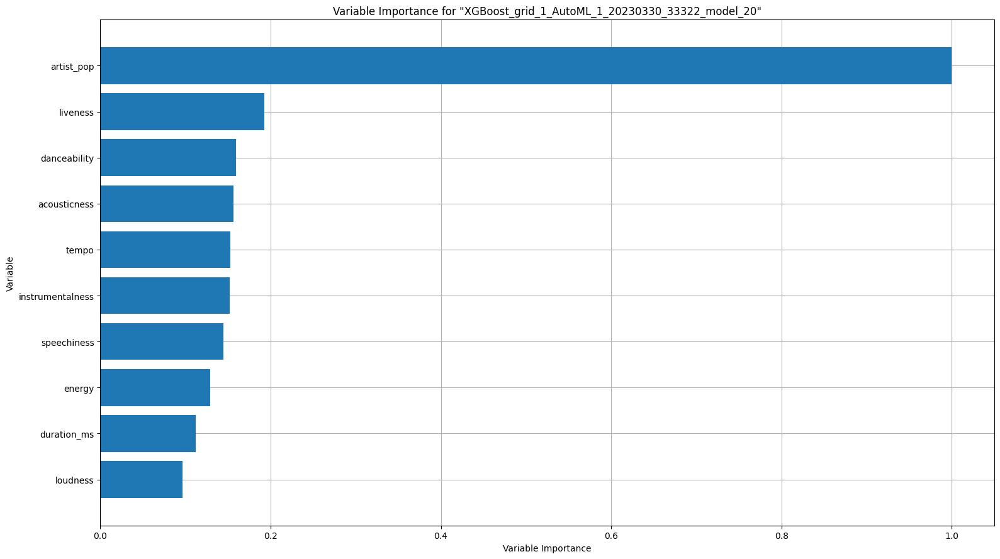

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

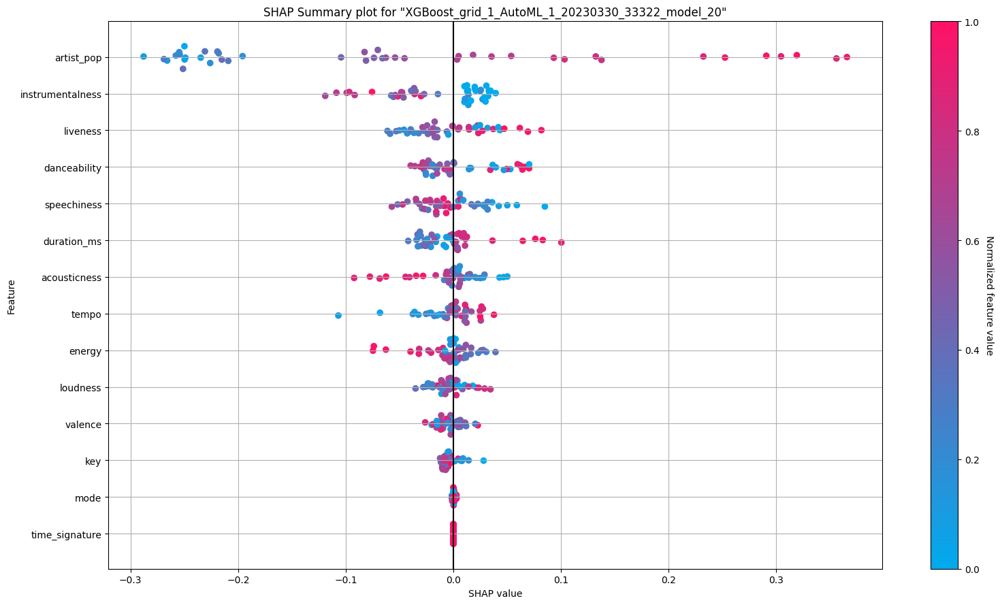

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

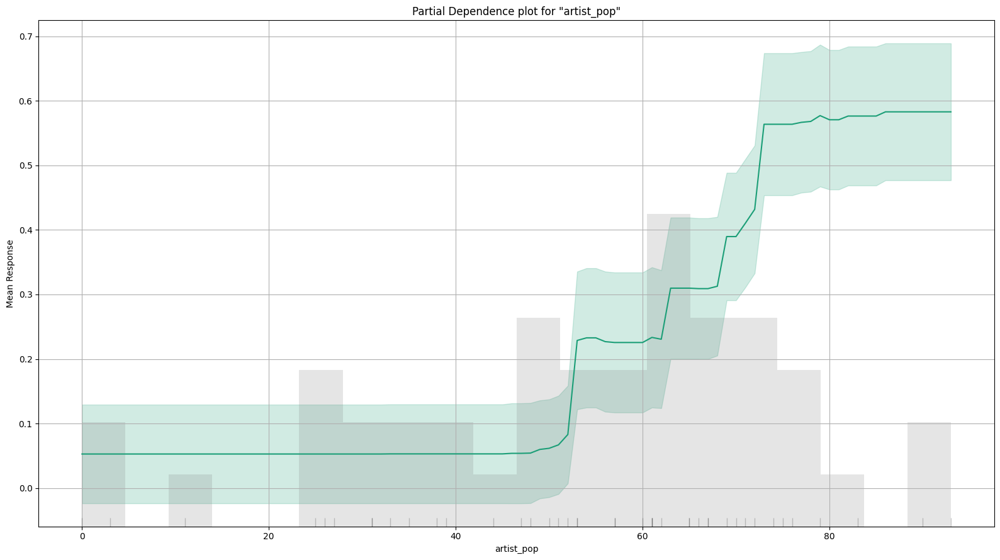

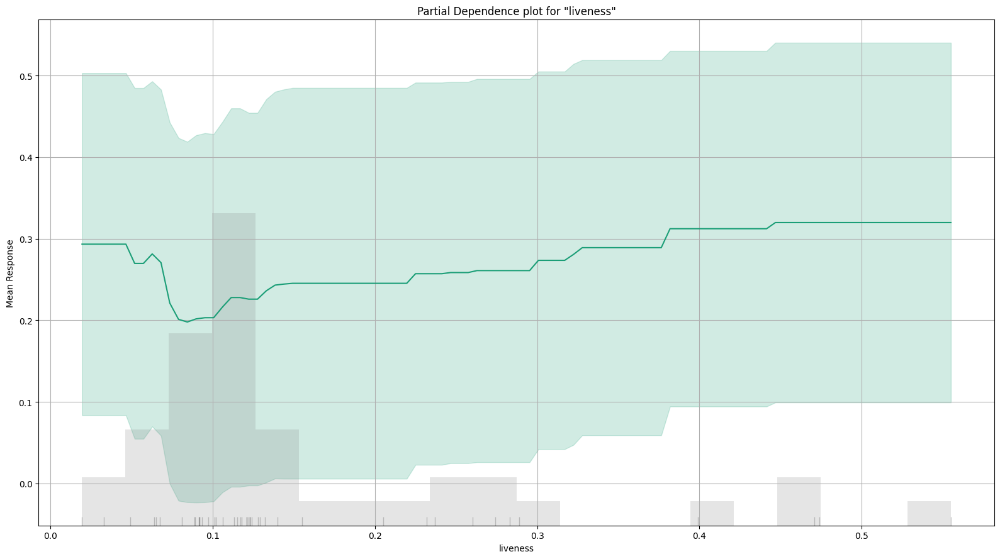

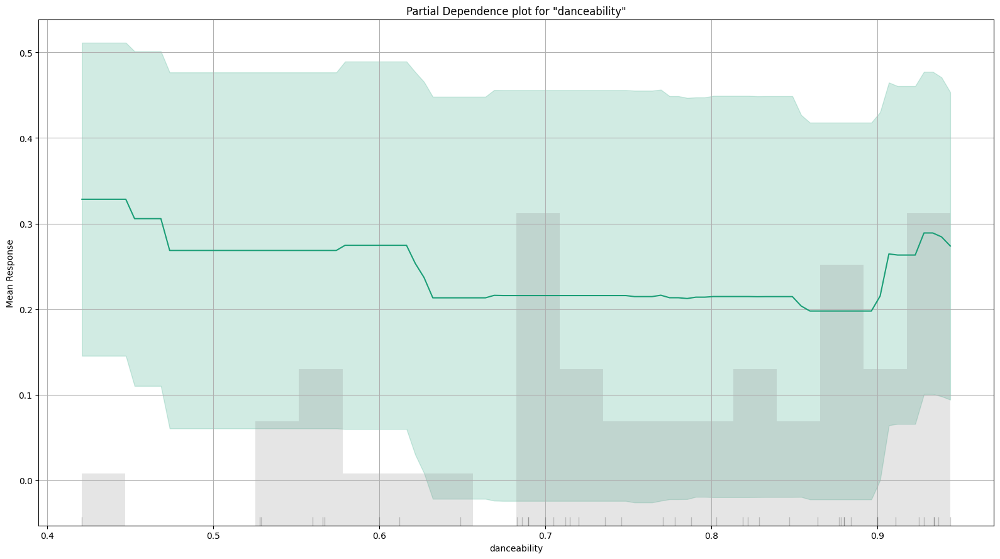

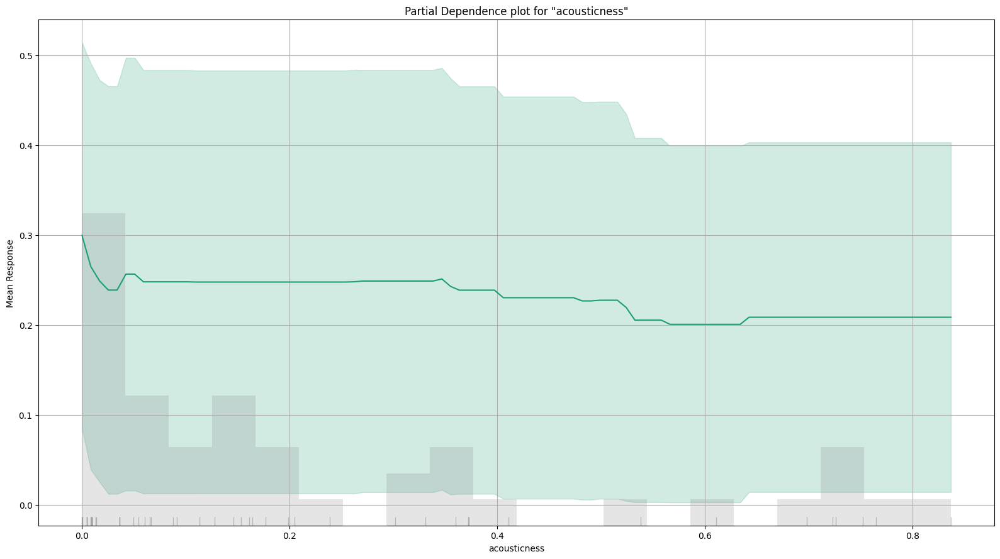

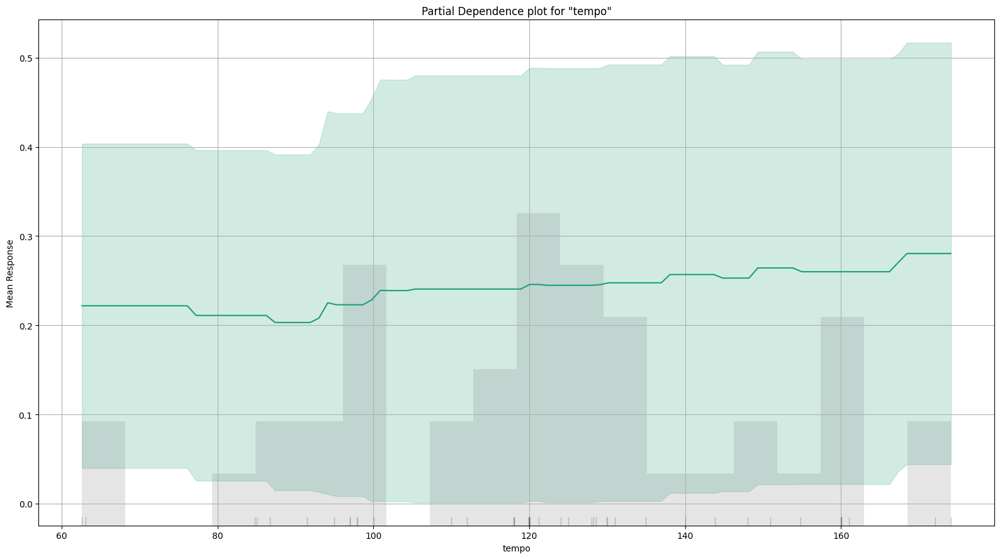

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

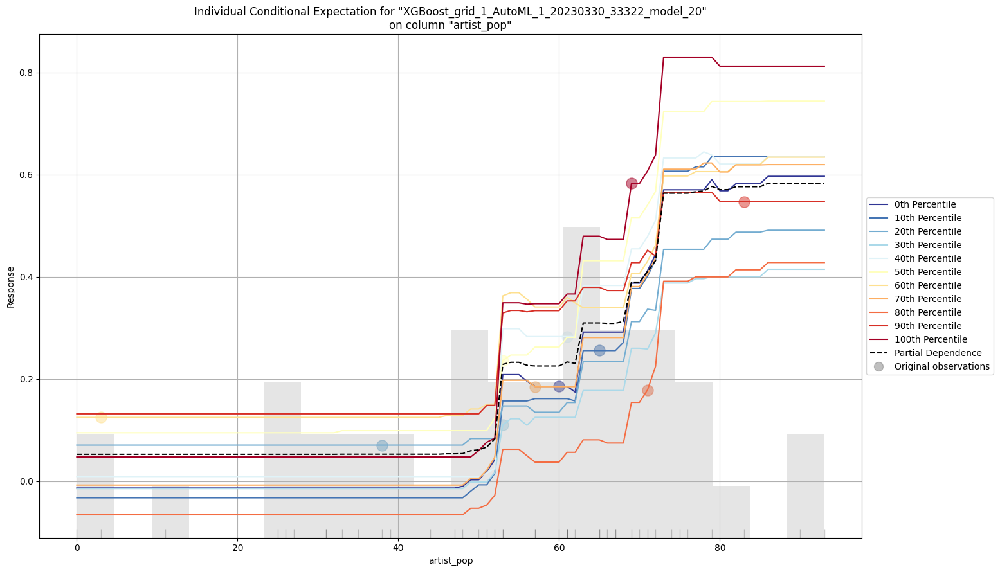

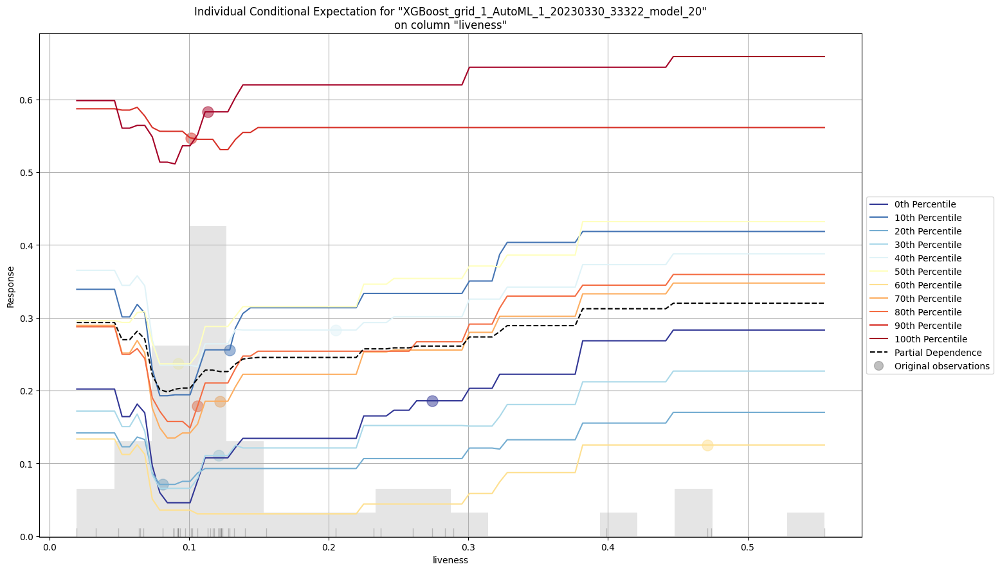

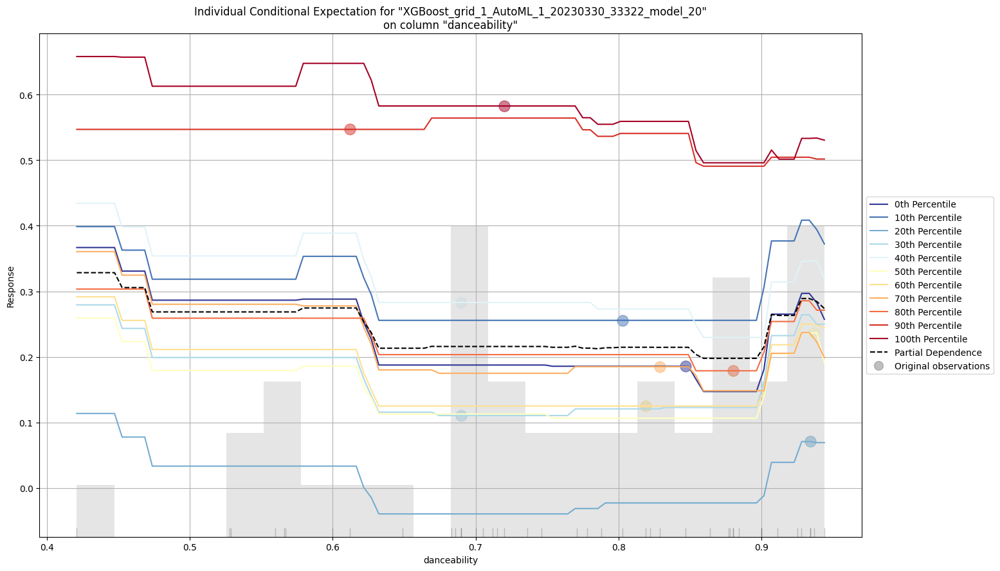

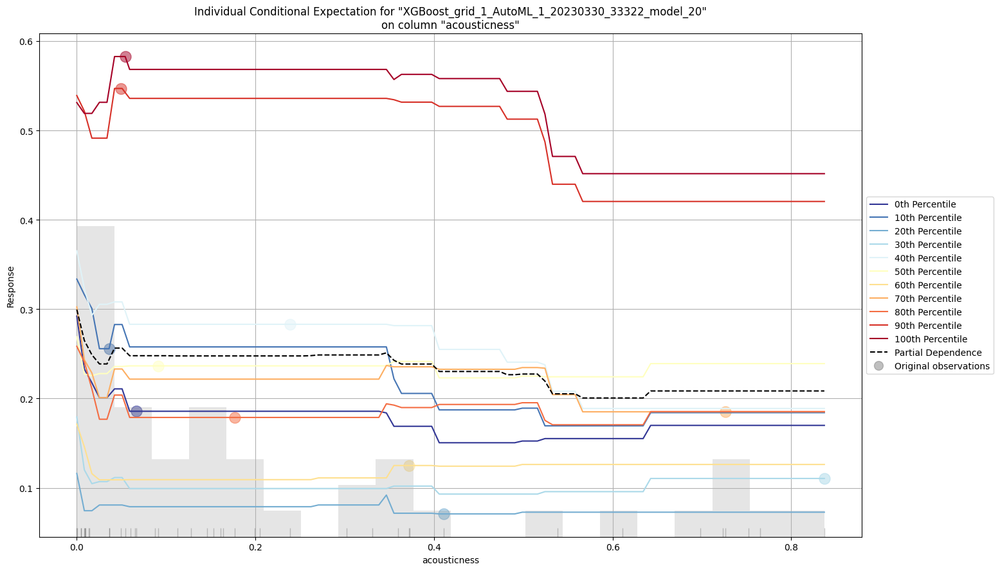

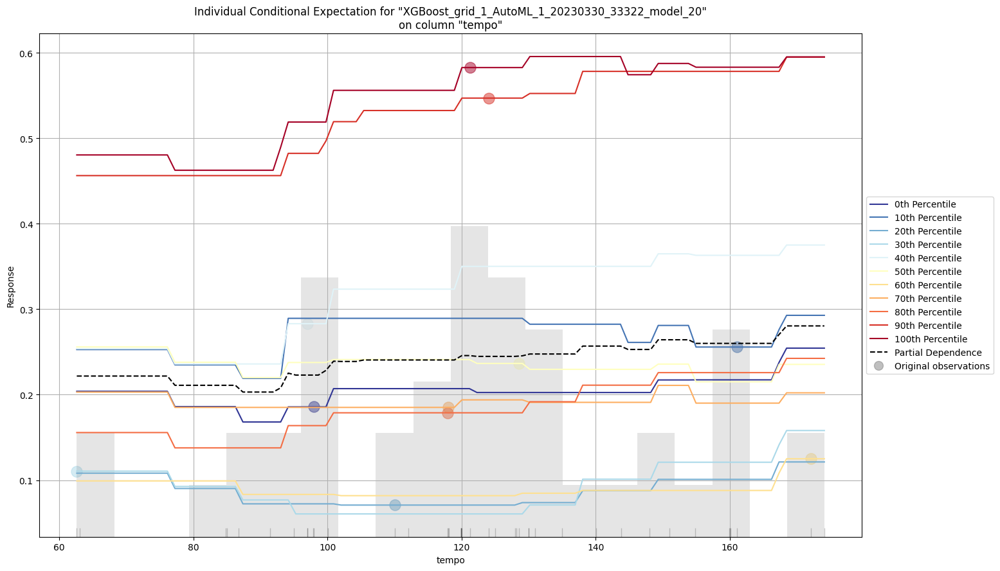

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

In [80]:
autoML_model.explain(autoML[1])  #AutoML Explainability

Linear and tree-based models - SHAP Analysis:

Here, the output is on the y-axis as we vary the feature, and the x-axis represents the feature. The gray histogram represents the dataset's variable distribution, and the cross formed by E[Feature] and E[f(x)] represents the anticipated values.

Take danceability as an example.

For the linear model the cross is made at approx E[f(x)] : 0.270
For Tree-based model the cross is made at approx E[f(x)] : 0.330


So as the Energy increases the expected value also increases

Talking about the red line on the plot - When we give a sample (sample_ind = 20) as an input to check the output. By plotting this we can see the difference between the model output from the expected value.



Permutation explainer: 201it [00:12,  3.59it/s]                         


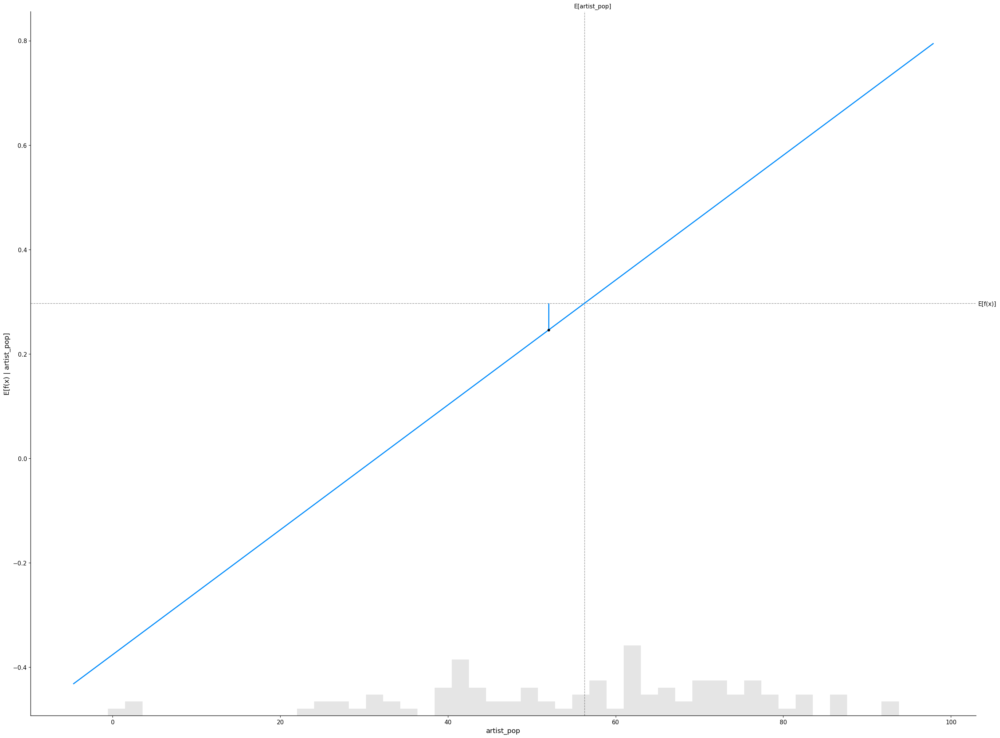

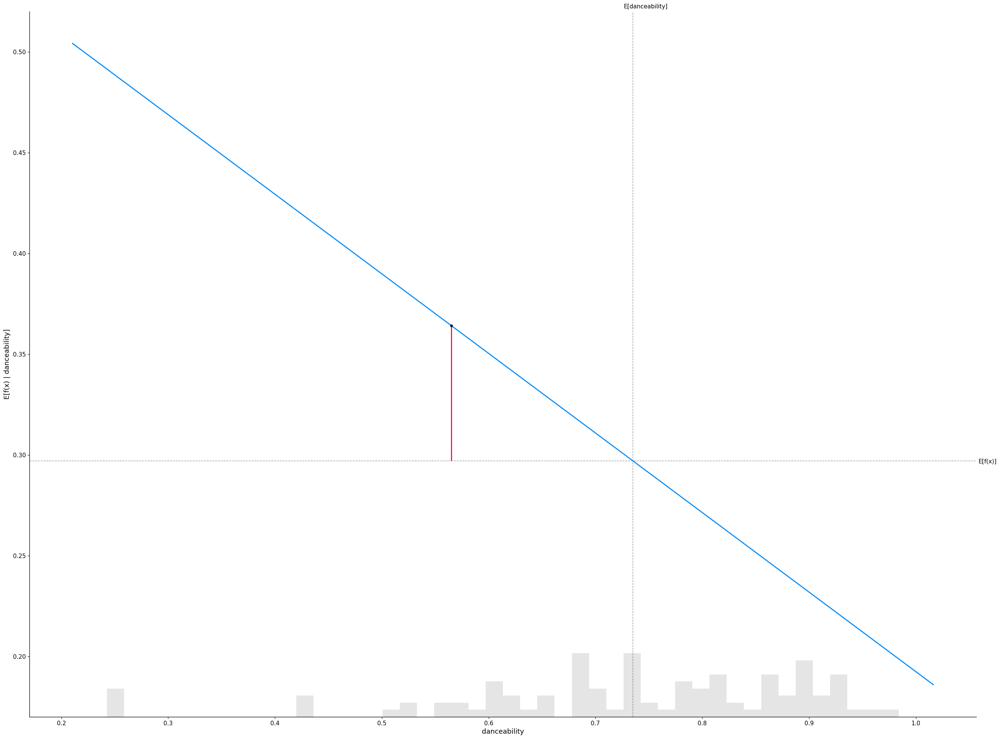

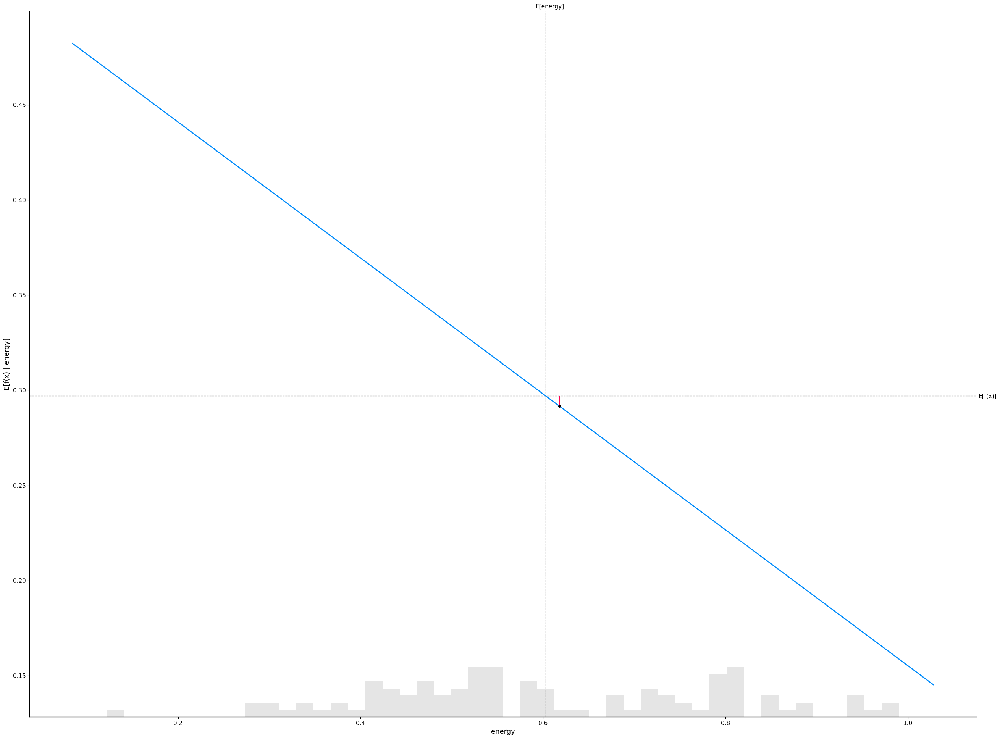

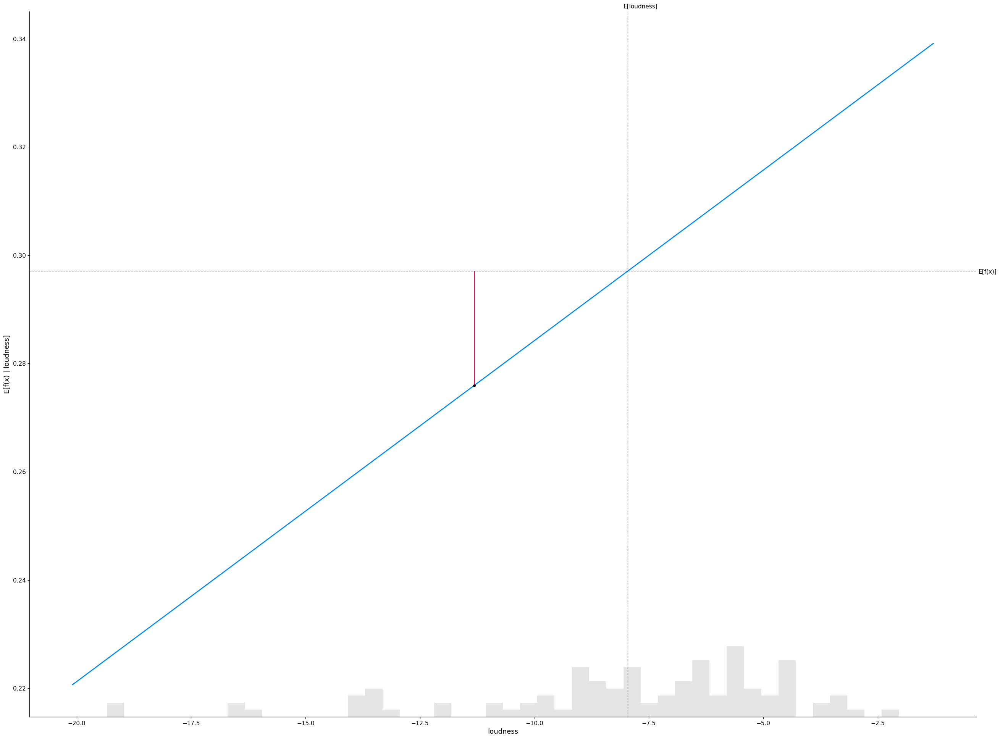

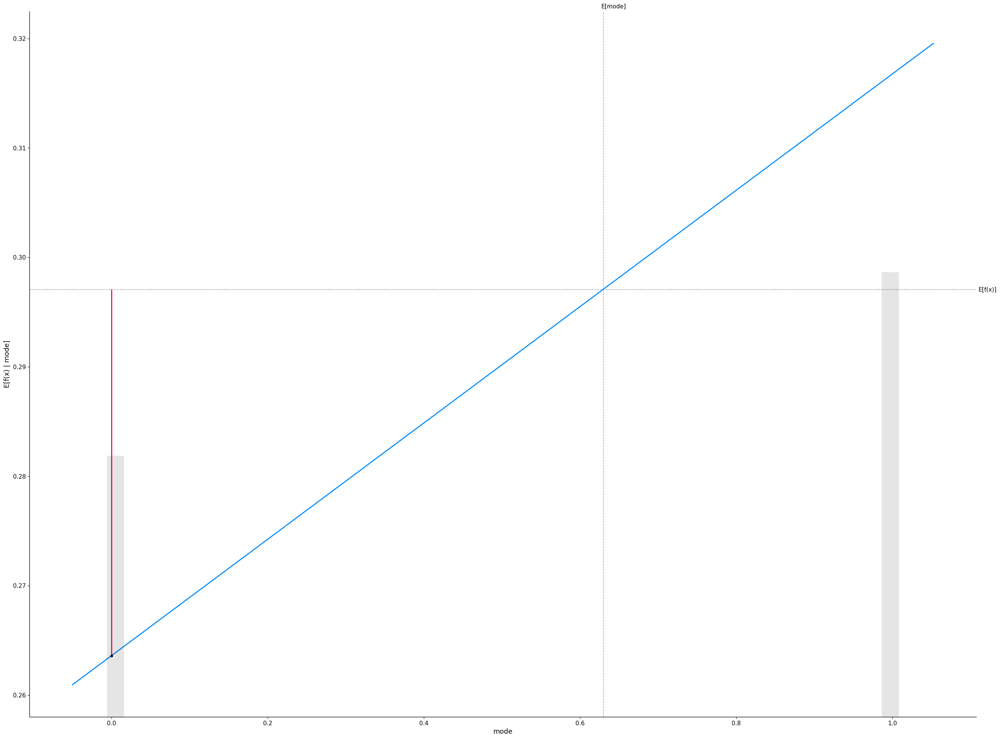

...

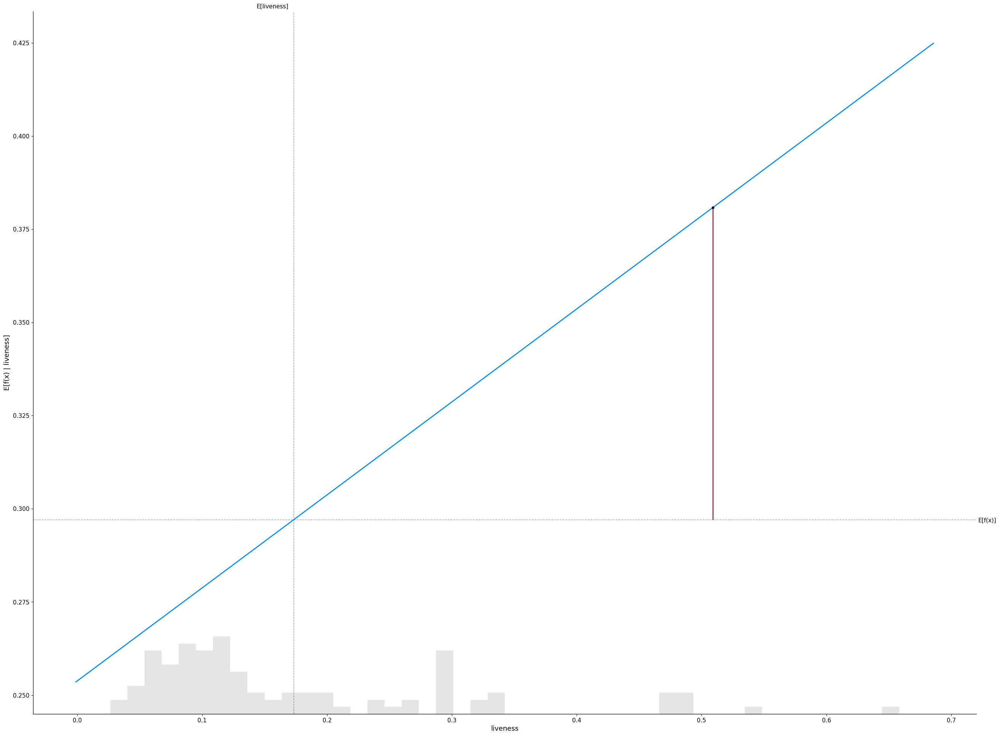

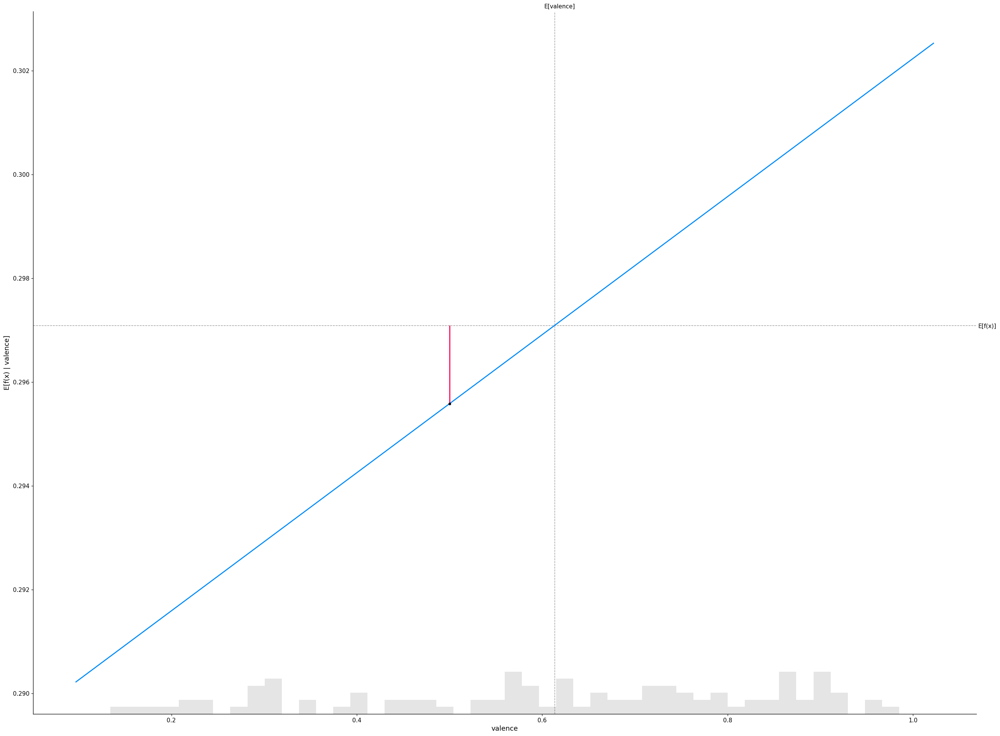

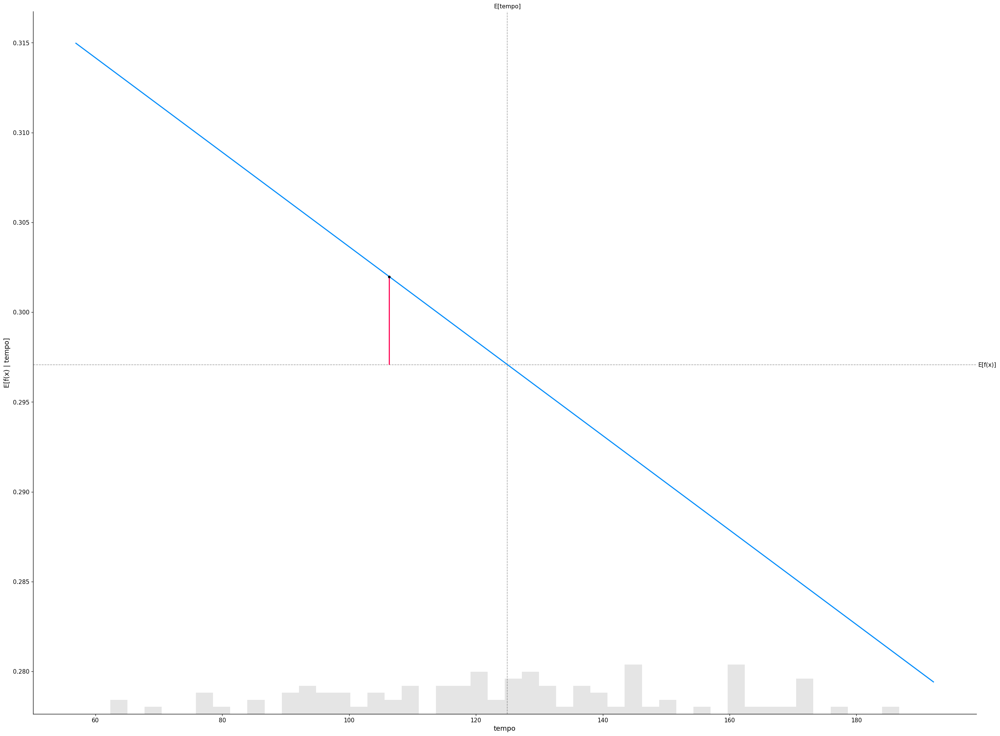

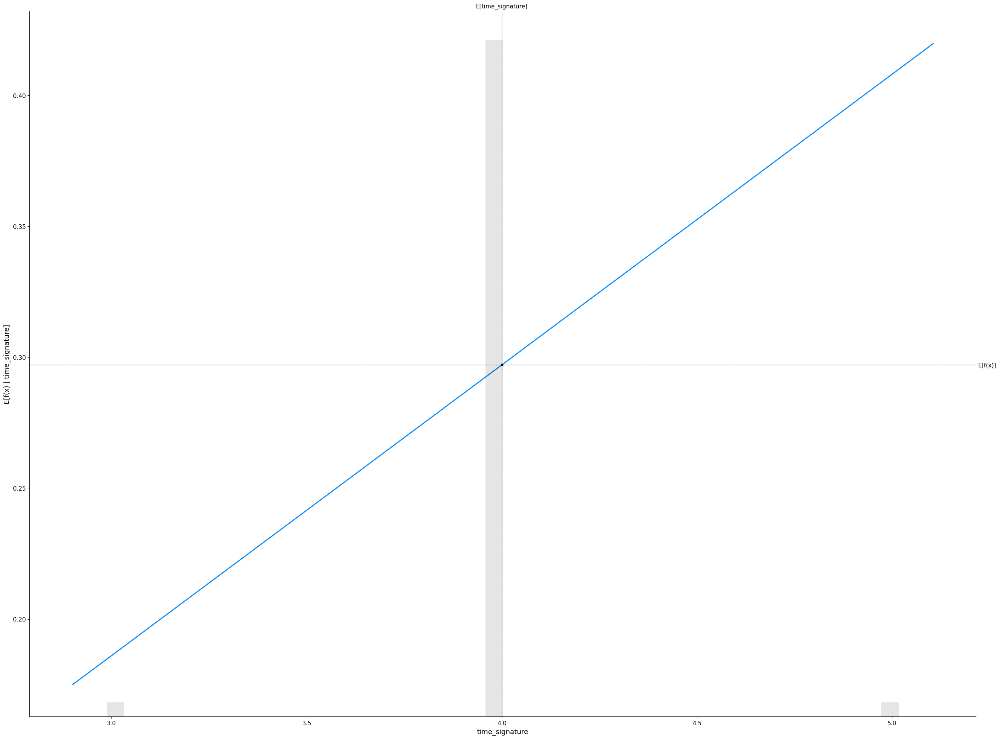

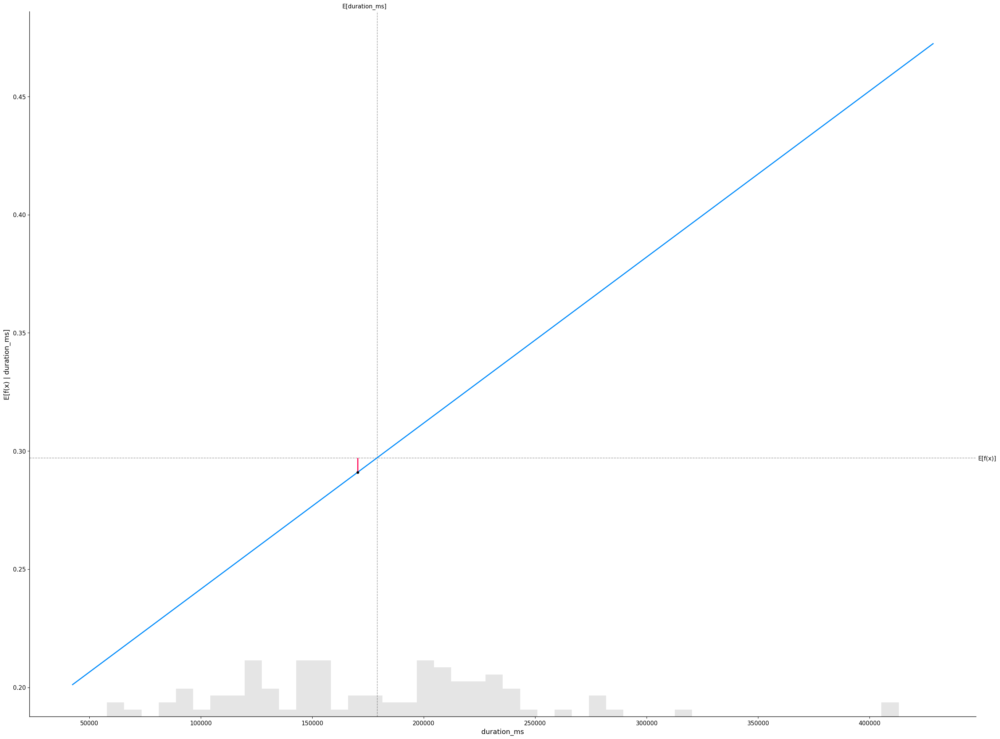

In [81]:
linear_explainer = shap.Explainer(linear_model.predict, x_train_100)
linear_shap_values = linear_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 20
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )

SHAP Analysis for Linear and Tree-Based Models
Here the x-axis is the feature and the y-axis is the output as we vary the feature. The grey histogram is the distribution of variables in the dataset and the cross made by E[Feature], E[f(x)] is the expected values.

Let us take a feature of Energy

For the linear model the cross is made at approx E[f(x)] : 0.270


For Tree-based model the cross is made at approx E[f(x)] : 0.330


So as the Energy increases the expected value also increases

Talking about the red line on the plot - When we give a sample (sample_ind = 20) as an input to check the output. By plotting this we can see the difference between the model output from the expected value.

Permutation explainer: 201it [00:14,  4.35it/s]                         


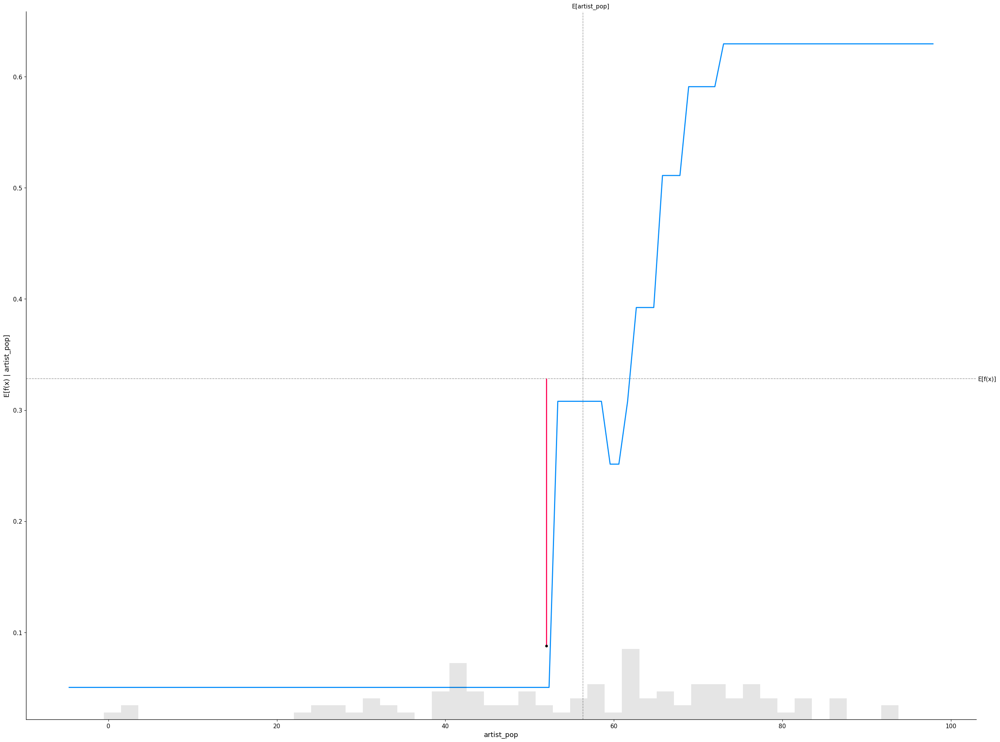

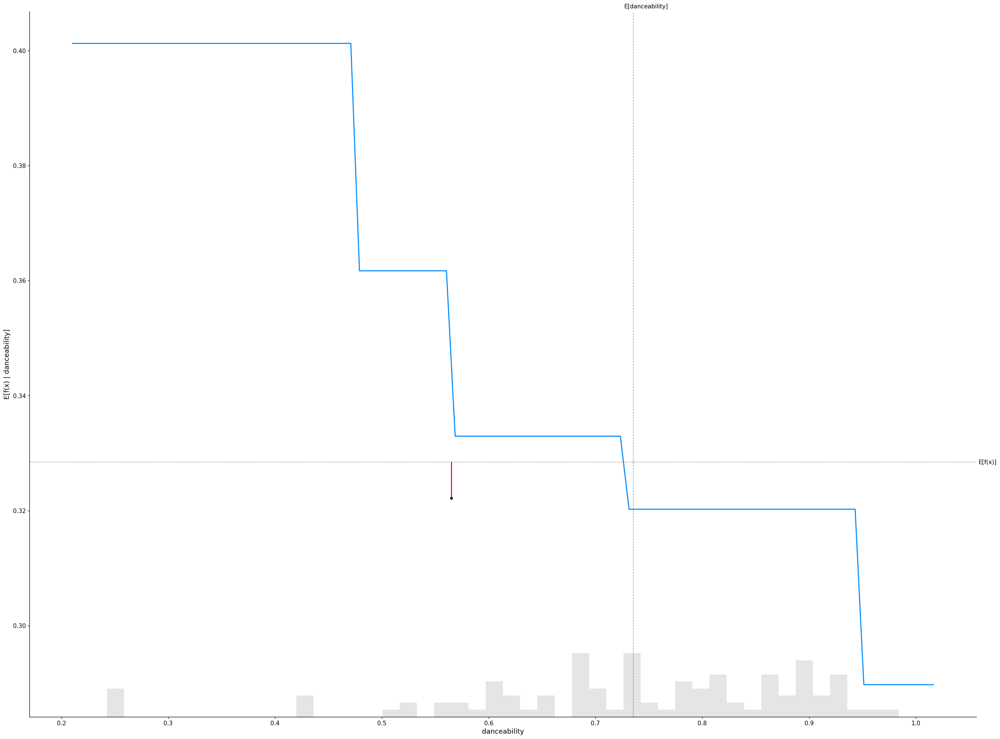

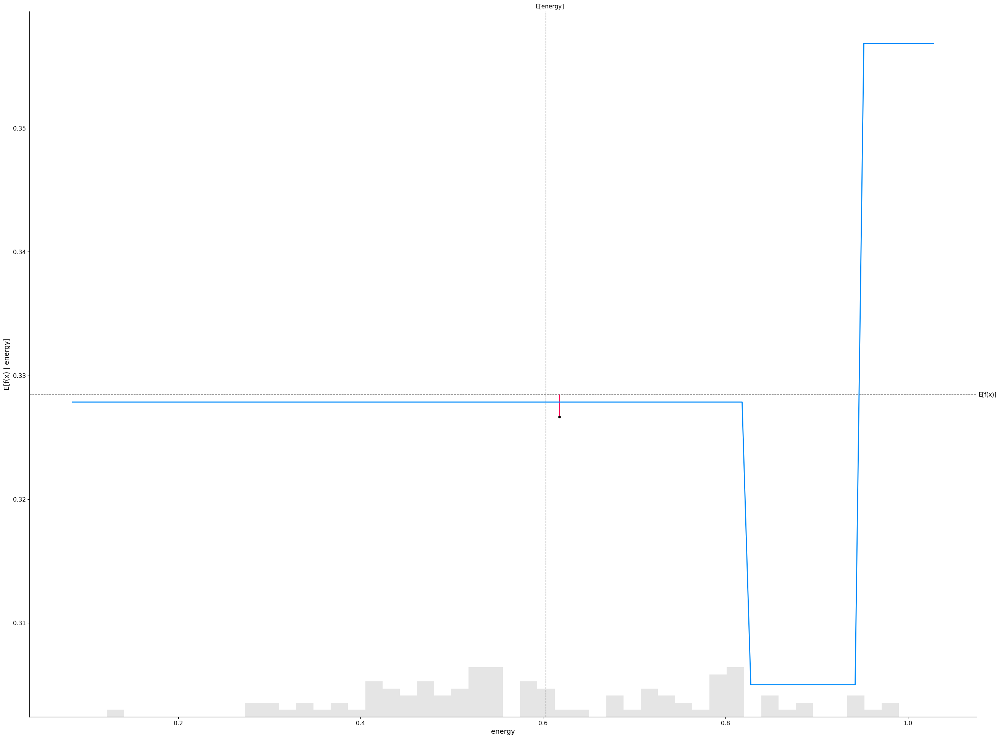

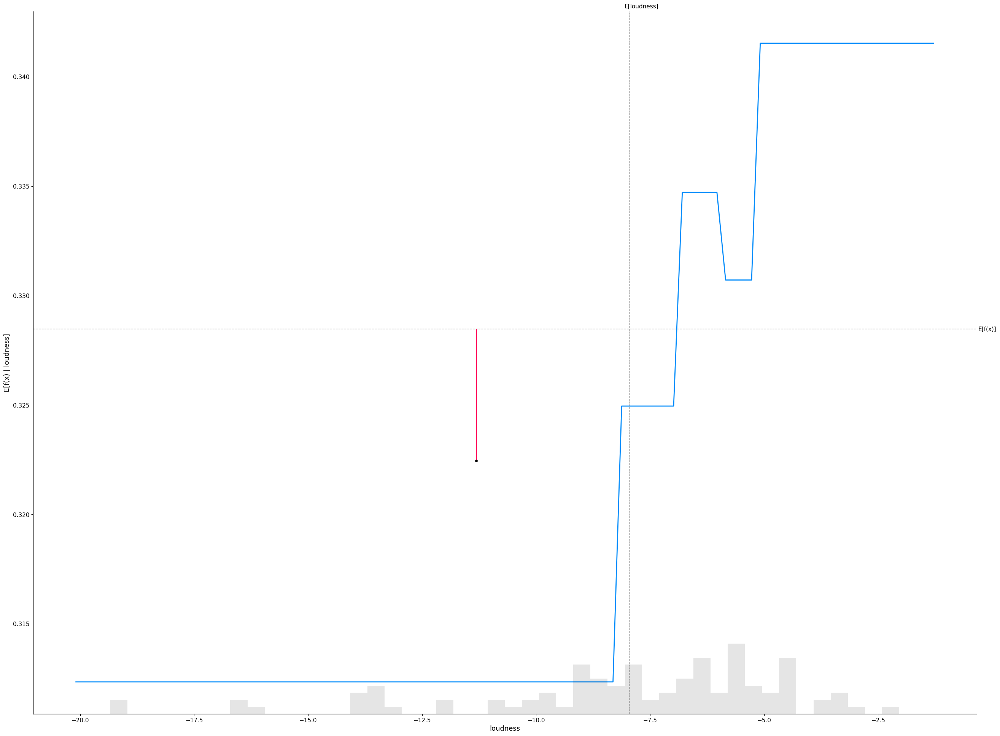

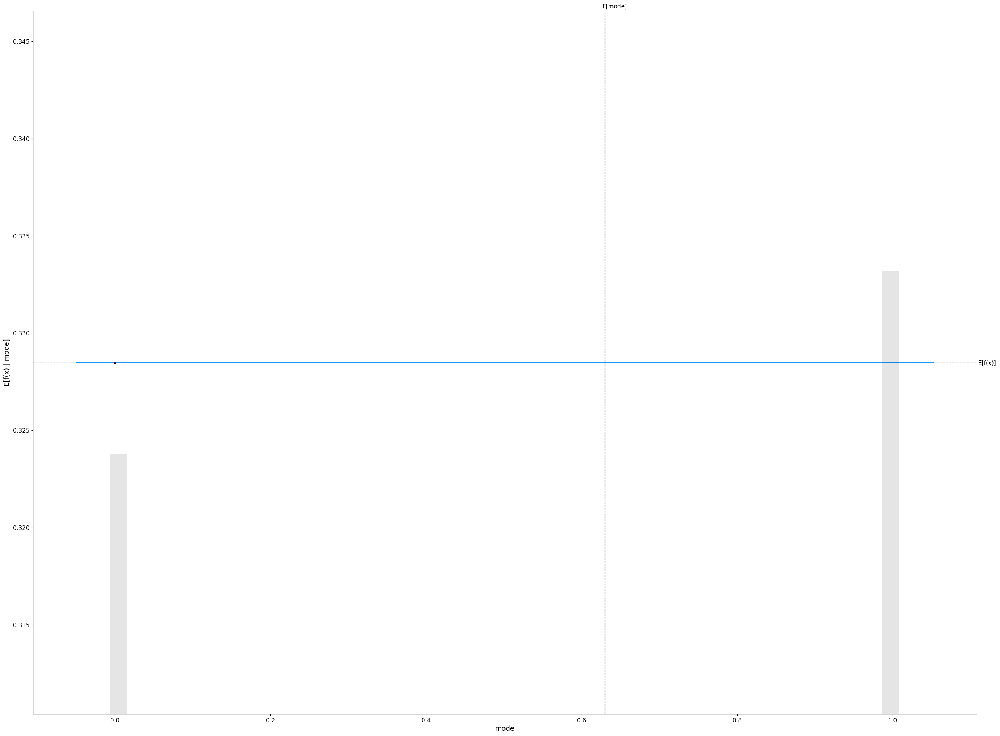

...

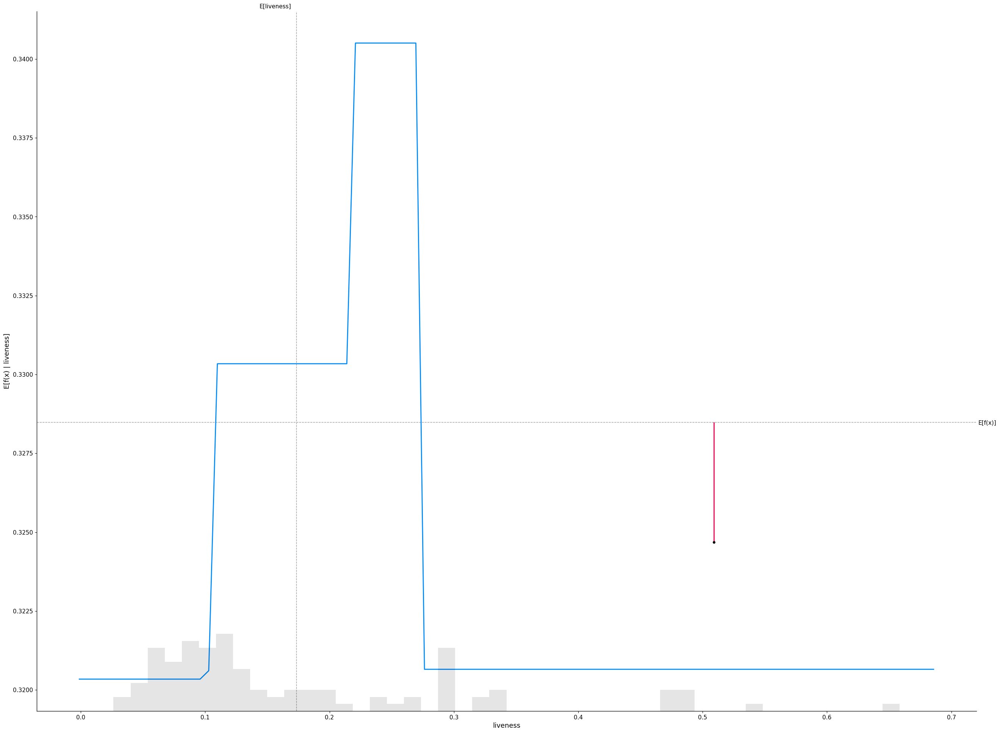

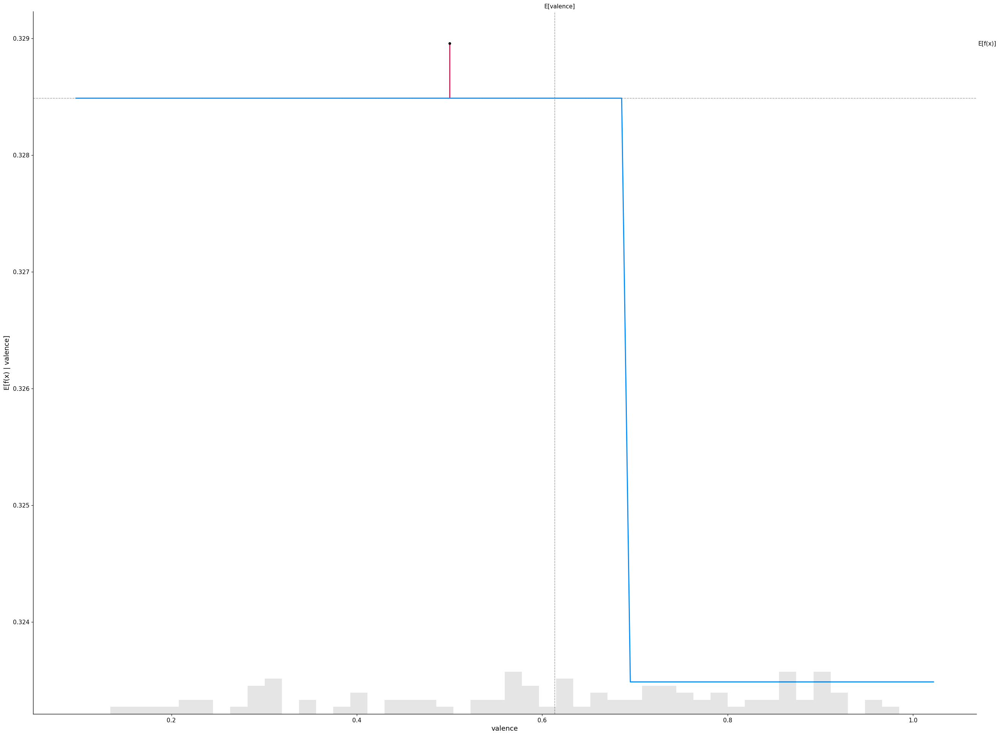

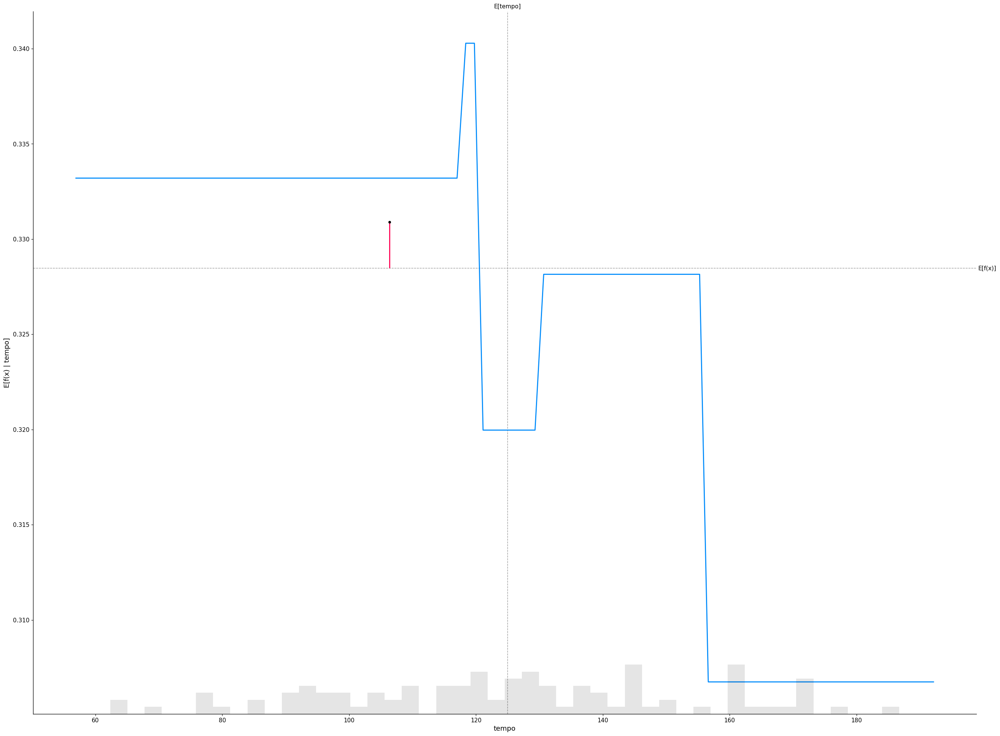

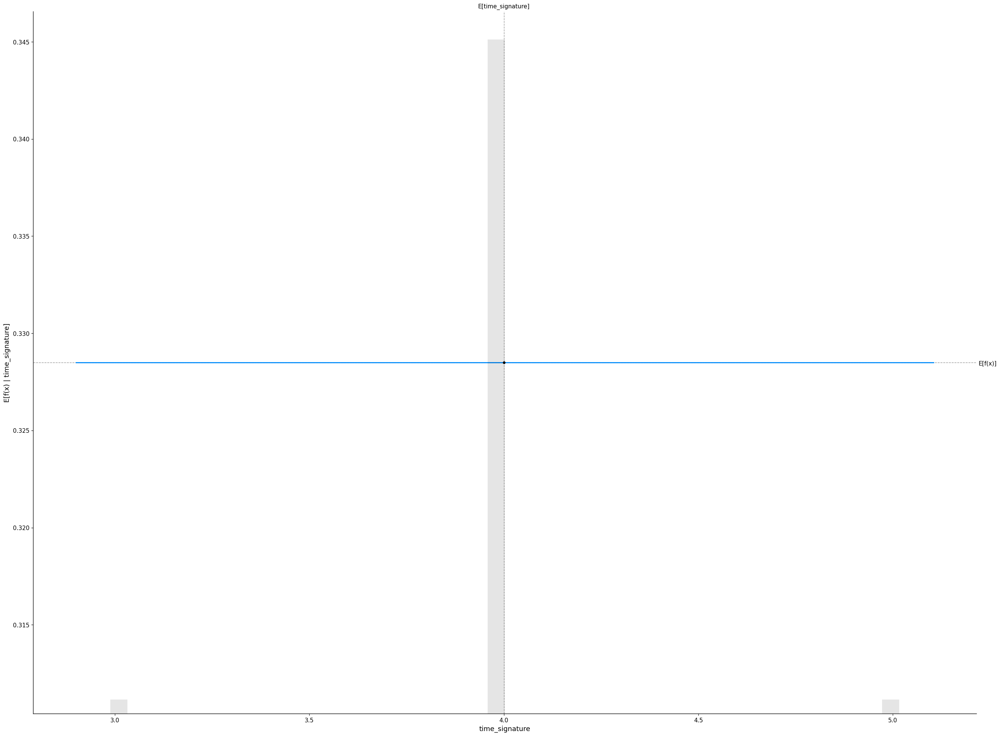

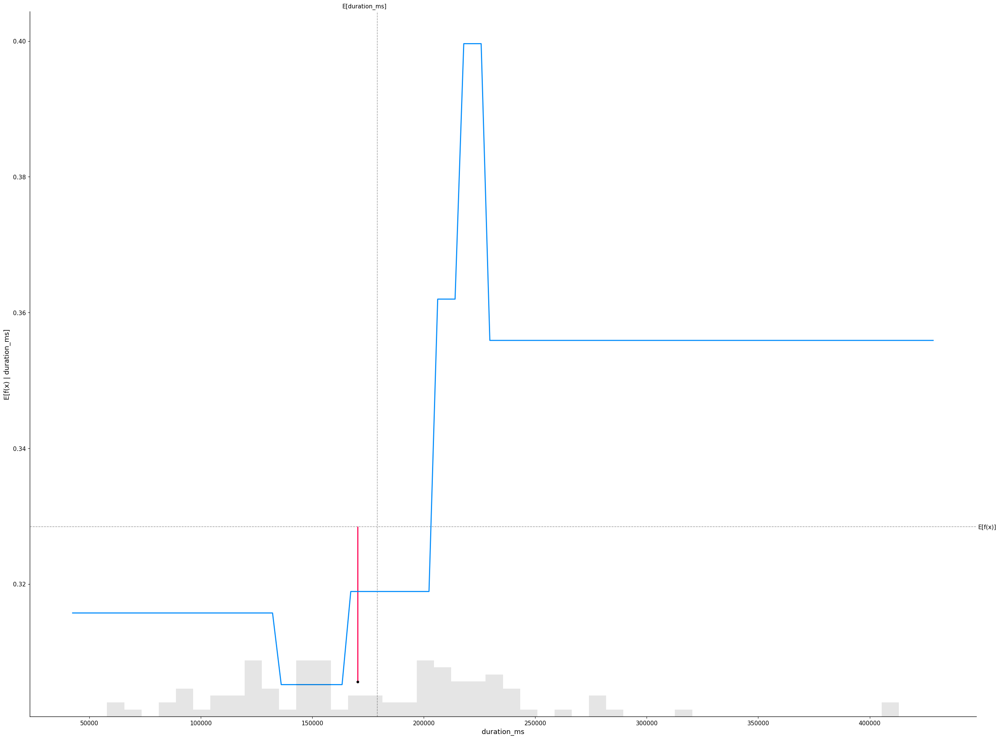

In [82]:
tree_explainer = shap.Explainer(tree_model.predict, x_train_100)
tree_shap_values = tree_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 20
    shap.partial_dependence_plot(
        i,
        tree_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

# Understanding the Linear and Tree-based SHAP Feature Importance Plots
The basic idea underlying SHAP feature importance is that each feature in a model is rated according to how significant its corresponding Shapley values are. The absolute Shapley values are averaged over all of the data points to get a broad assessment of feature relevance. The obtained values are then plotted to show the relative relevance of each attribute and sorted in descending order.

The SHAP feature significance plots for a linear model and a tree-based model show that there are variations in the feature important rankings between the two types of models. This implies that the relative importance of various traits may change depending on the modeling strategy employed and that SHAP analysis might offer helpful insights into the variables influencing model predictions.

artist_pop is the most significant characteristic for both the models, but when we consider characteristics:

in the linear model,  danceability and energy are the significant features and speechiness is the most significant feature for our tree-based model when we take the average of SHAP values into account.

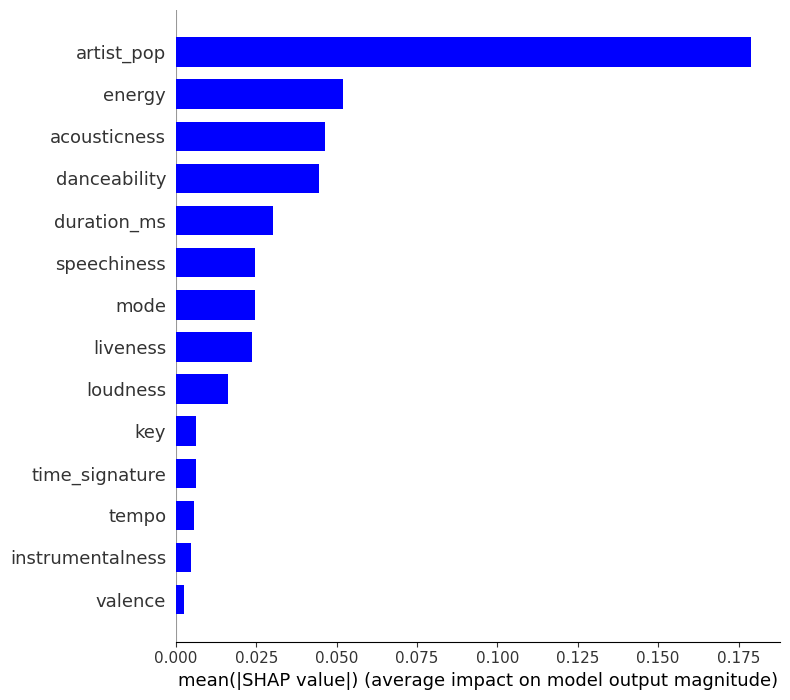

In [83]:
shap.summary_plot(linear_shap_values, x_train, plot_type="bar", color="blue")

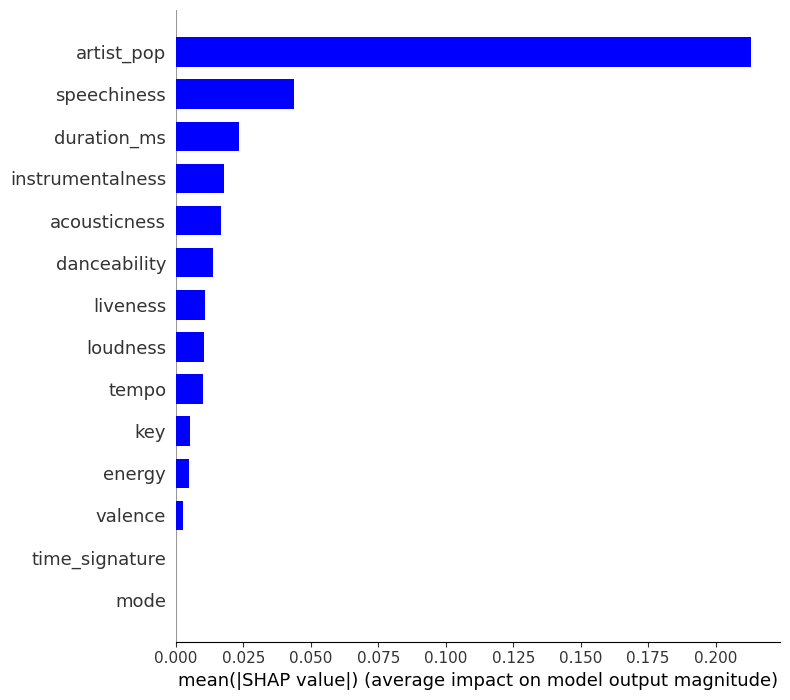

In [84]:
shap.summary_plot(tree_shap_values, x_train, plot_type="bar", color="blue")

Using the Waterfall SHAP visualization to interpret:

Consider using the same sample (sample ind = 20).
Be aware that the waterfall model's value for Energy corresponds to the partial dependence plot for SHAP. It says that the expected outcome for this sample was f(x) = 0.535 but the model output was f(x) = 0.304. We were quite near to figuring it out, despite the fact that the difference is only 0.2. The waterfall model outlines the steps we took to reach the goal and the contributions each component contributed. The Value of Popularity for this sample increased by 0.07 points, as seen in the graph below, while Energy had the biggest and most significant impact. Following audio advice had an impact and increased this sample's popularity score by 0.05.


With the same data, we may similarly understand the tree-based model.
Although the predicted value for energy was 0.36, the output we received was 0.406. The only difference between the tree-based model and the linear model is the size of the influence that each attribute has. Here, speechiness play a significant role in determining the output of the tree-based model, whereas in the linear model, energy had the greatest influence


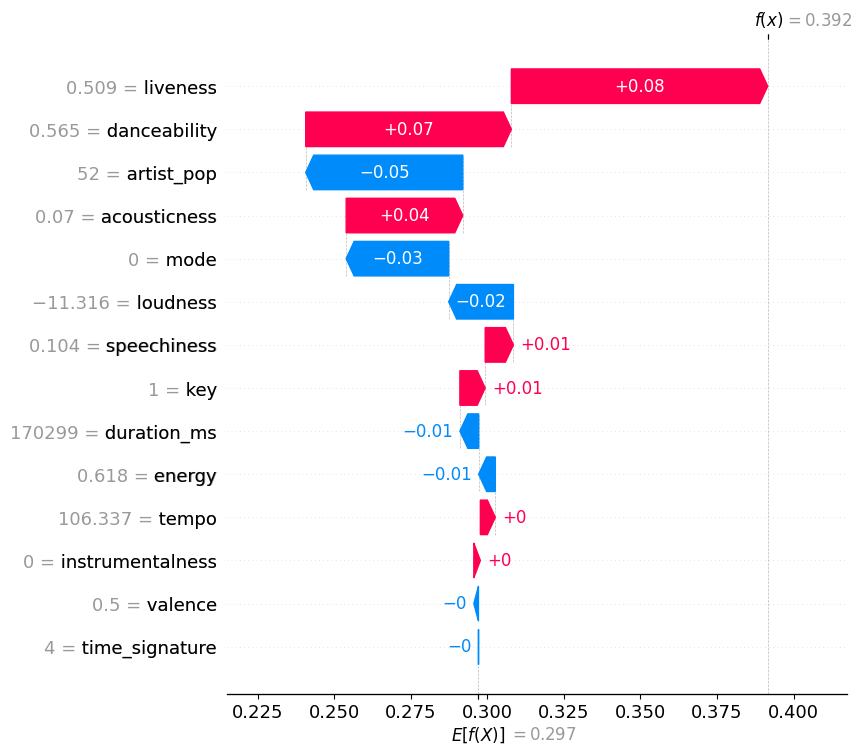

In [85]:
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)

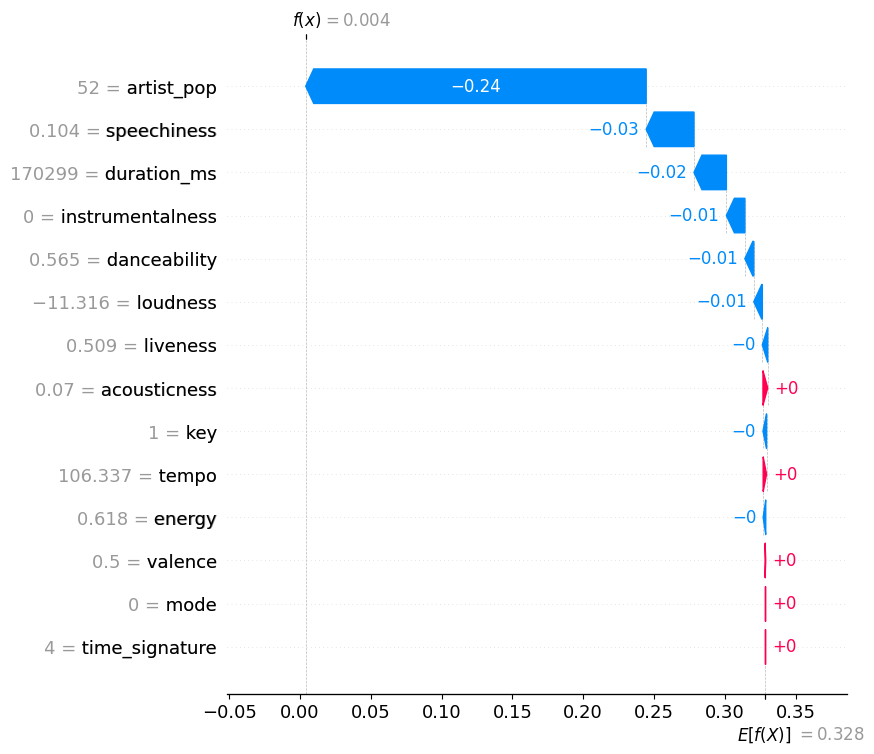

In [86]:
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

Understand the linear and tree-based model's summary plot:

The features are ranked in this section from most important to least important. One of the simplest methods for determining how an ML model's attributes are affecting the target and to what extent is to do so.

Red dots indicate greater values, while blue dots indicate lower values in this diagram that illustrates the influence of various musical elements. Each dot's location on the x-axis corresponds to how much of an influence it will have, with dots located more away from the y-axis having a bigger impact. On the y-axis, positive affects are depicted on the right, and negative impacts on the left.

According to the graph, more popularity is correlated with higher energy values, as well as shorter song duration and lower time signature values. The distance of the dot from the y-axis can be used to determine the strength of each impact.


This image is quite helpful for understanding how our model is operating.

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


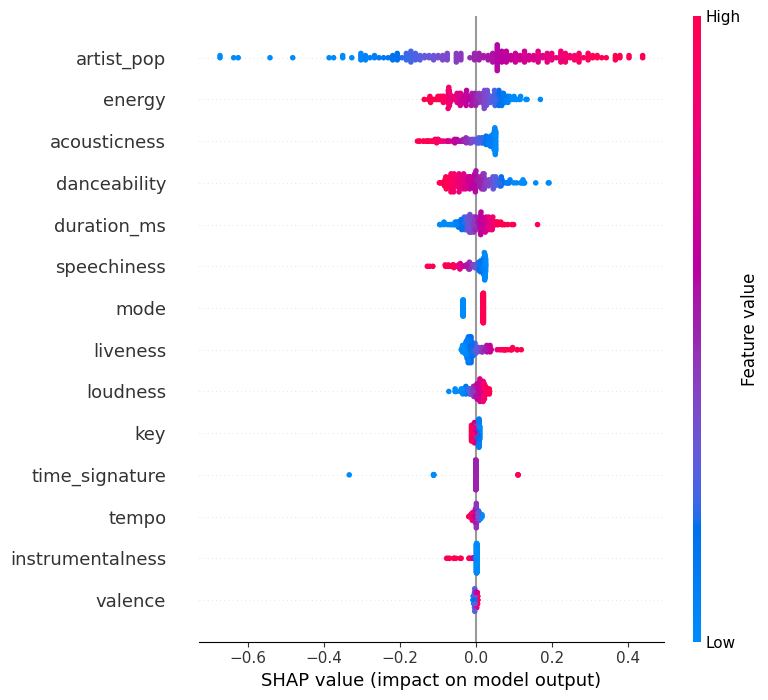

In [87]:
shap.summary_plot(linear_shap_values, x_train)

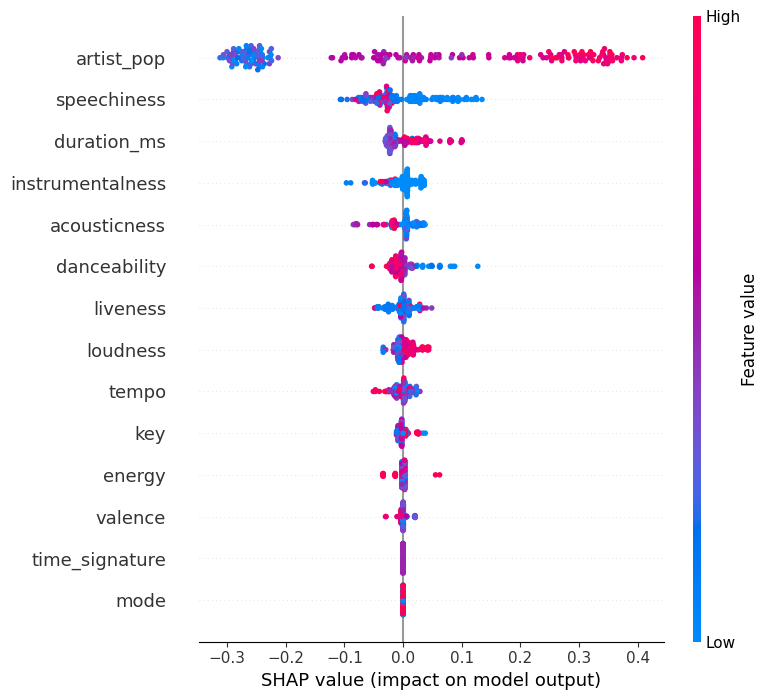

In [88]:
shap.summary_plot(tree_shap_values, x_train)

# Understanding the SHAP dependence graphic for the tree-based and linear models:

The SHAP dependency plot illustrates how little influence one or two features have on the predicted outcome of a machine learning model. It determines if the relationship between the target and a feature is linear, monotonic, or complex. Let's examine the SHAP dependency picture to better understand the tree-based and linear models. In this collection of graphs, each wine in our dataset is  represented by a dot.

As can be seen, the linear model feature and its SHAP value have a linear connection. The relationship between a feature and a song's popularity will be inverse if the feature has a negative impact on popularity and directly proportionate otherwise, as in the cases of loudness and danceability.

The relationship between a feature's tree-based model and its SHAP value is no longer linear. We can see that the SHAP dependence plot no longer exactly matches the partial dependence plot now that they are accounting for the interaction effects. If we look at the PDP, we lose all the high order interactions (ands and ors) in the model that our model may be doing. However, the SHAP defensive system takes these interactions in contrast to pdp.

Example of SHAP dependence plot of Accousticness:

Accousticness and its SHAP values have a linear relationship in the linear model. These graphs do not reveal much information; the only thing that can be determined is whether the relationship is directly proportional or inversely proportional.
By tuning the feature, we could pull data from the tree-based model about how a song's popularity is impacted. It also supports the conclusion we reached from the PDP and ICE graphic shown below.

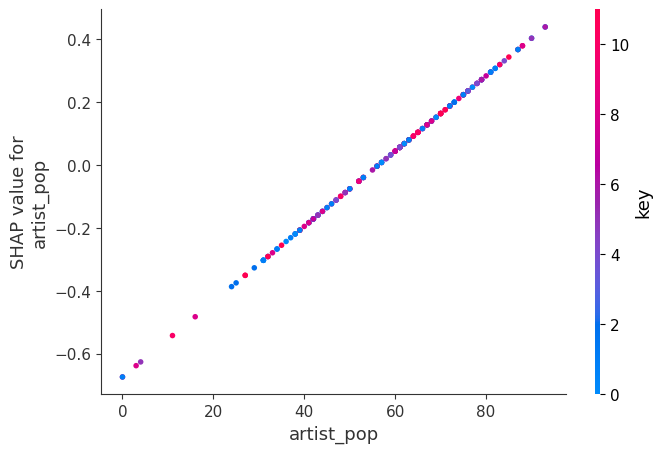

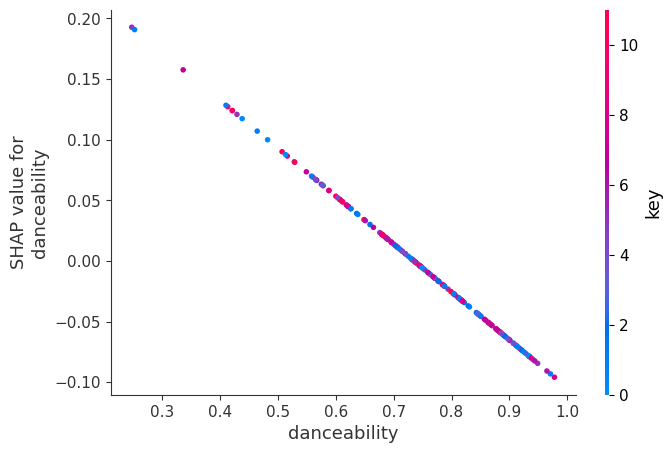

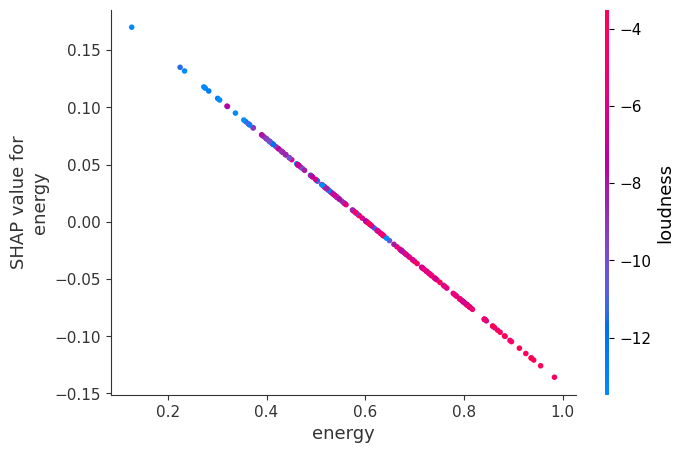

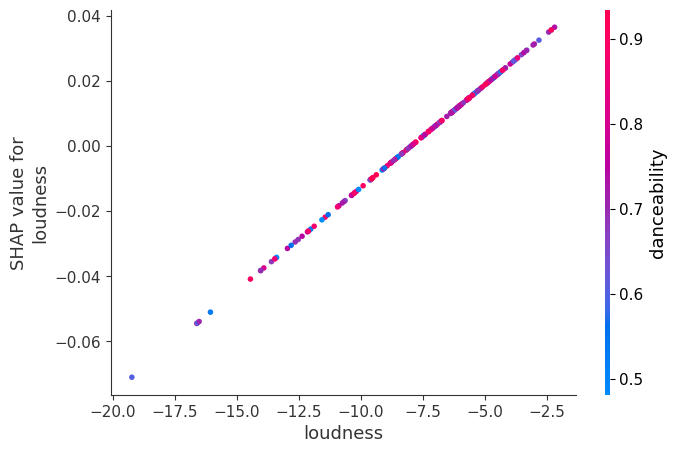

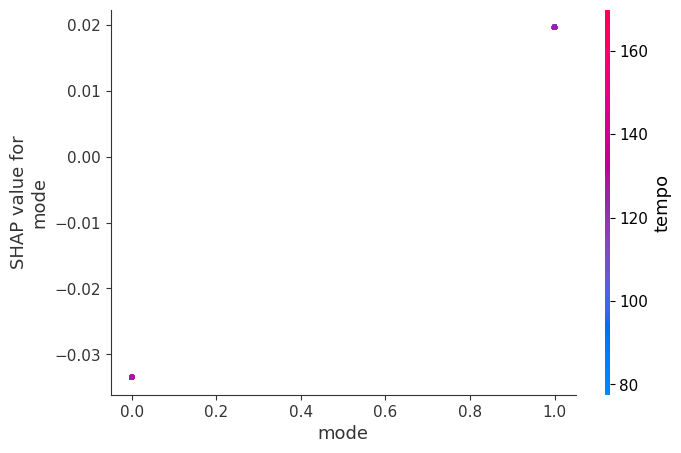

...

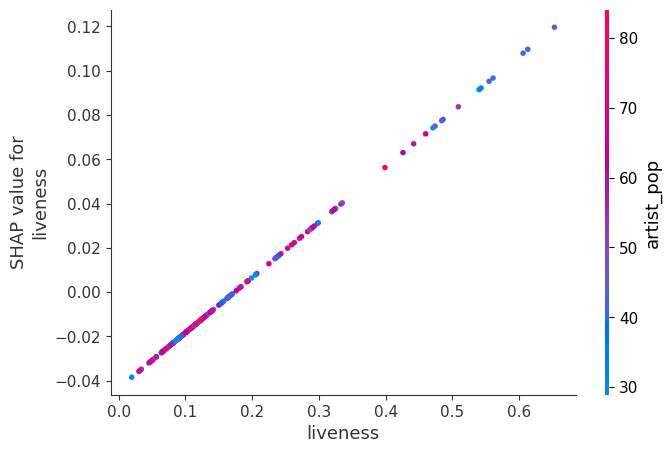

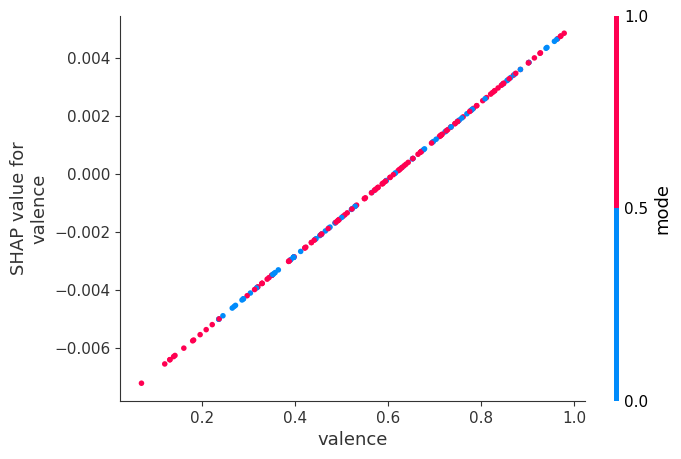

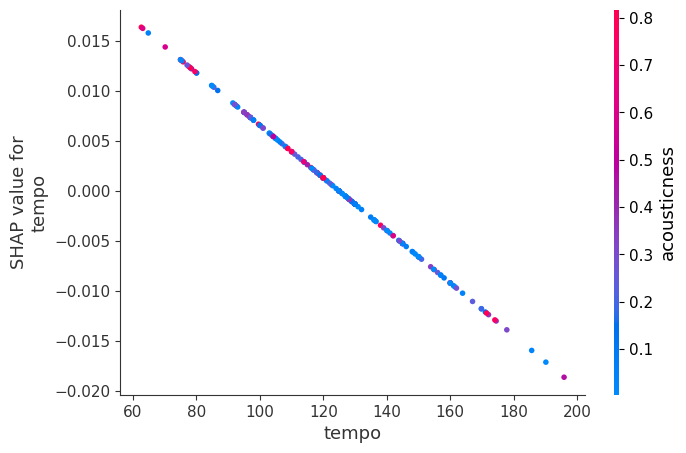

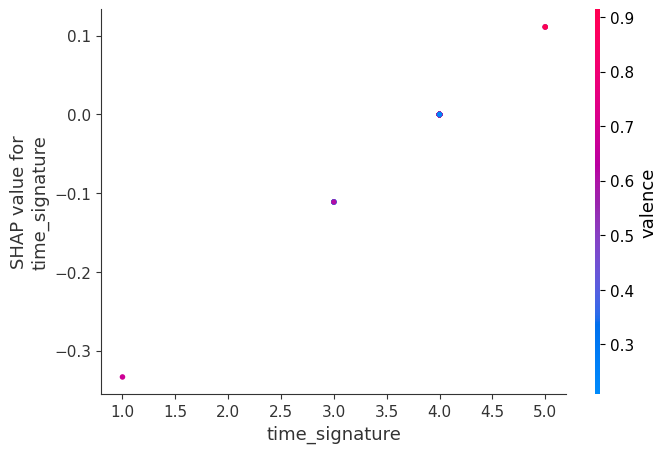

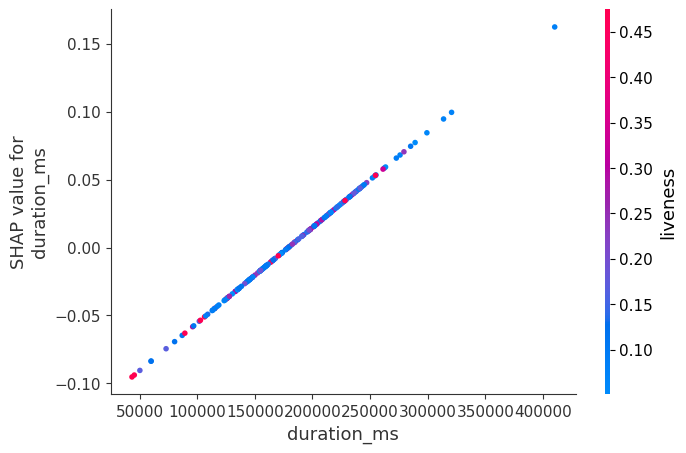

In [89]:
for i in x_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, x_train)

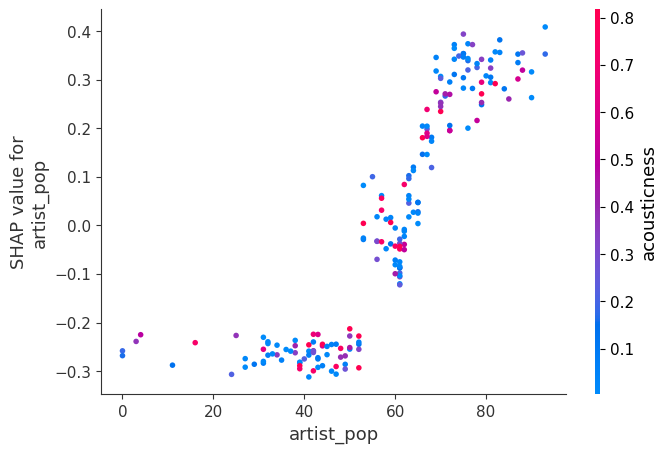

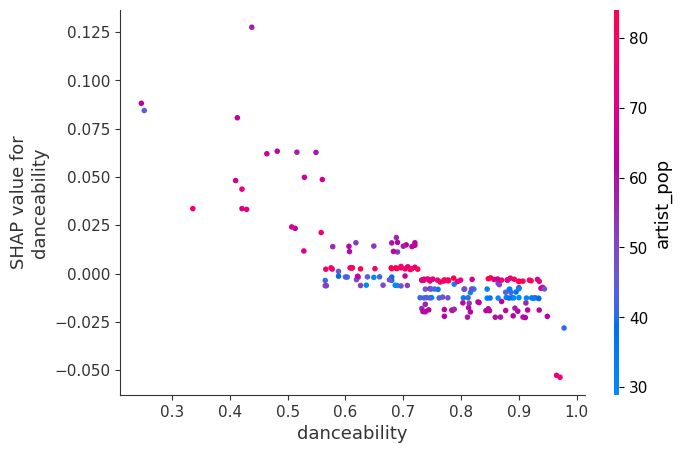

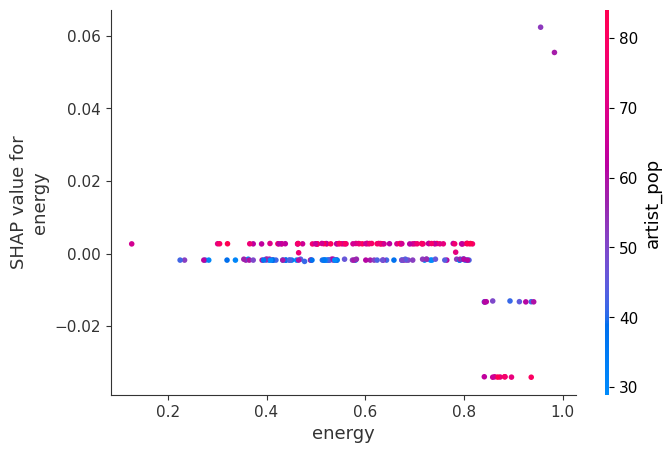

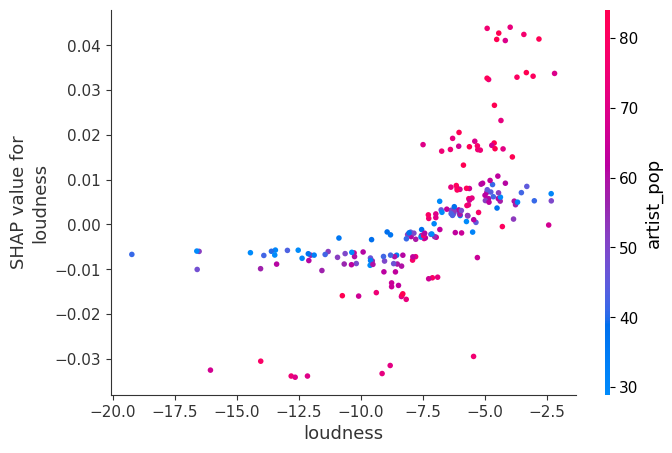

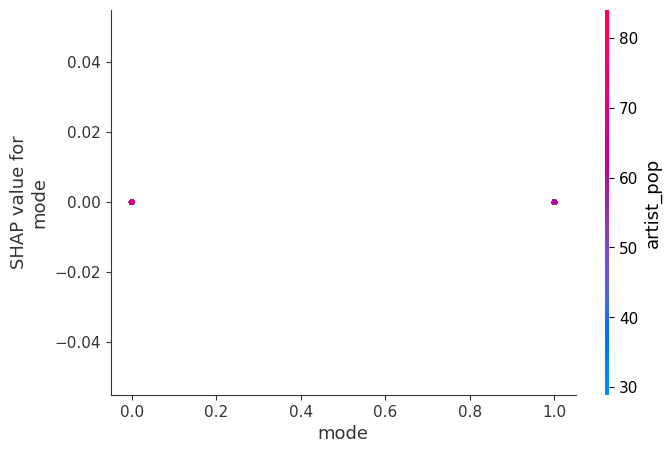

...

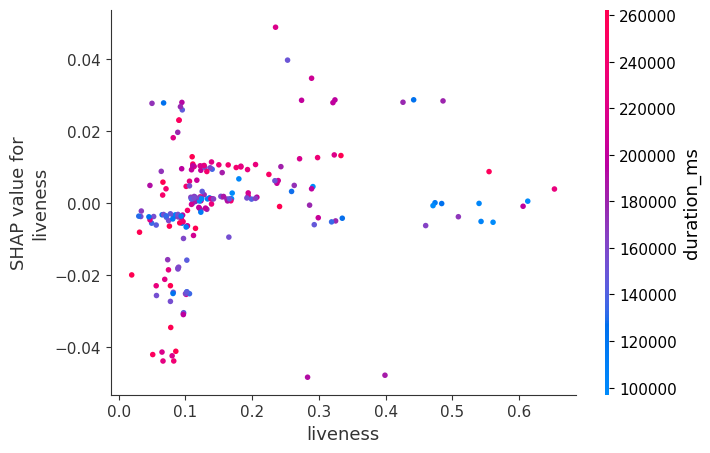

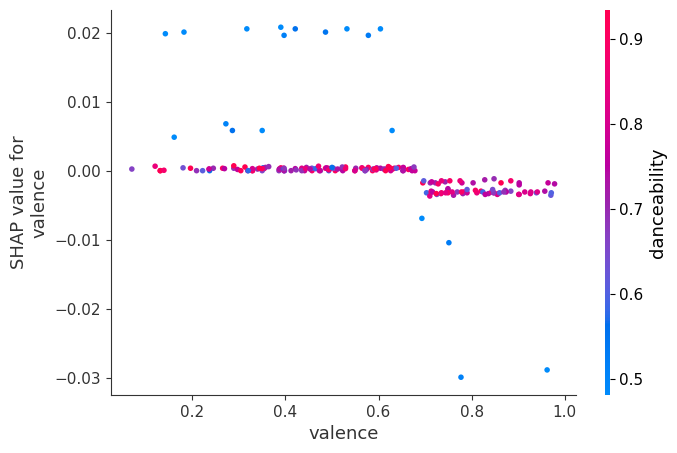

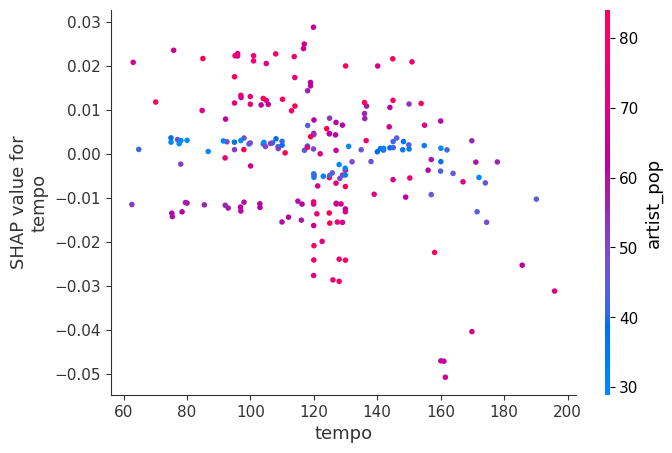

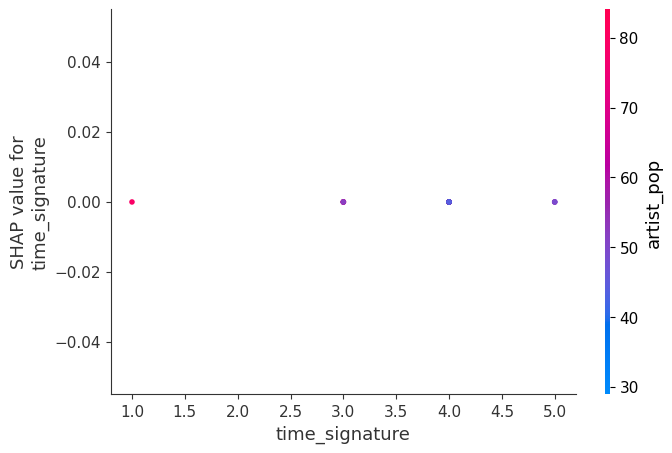

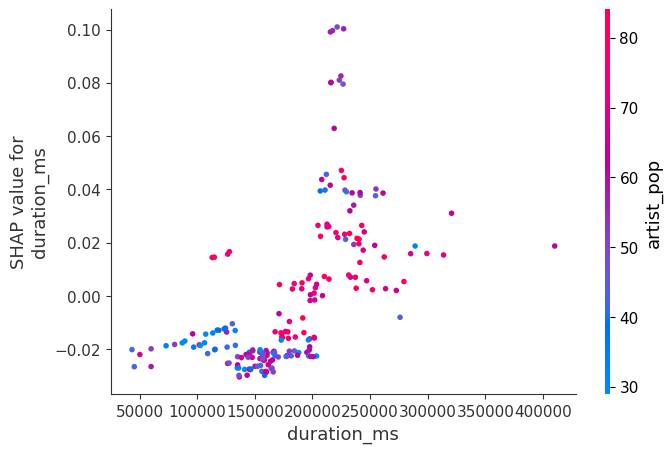

In [90]:
for i in x_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, x_train)

In [91]:
X_output_linear = x_test.copy()
X_output_linear.loc[:, "predict"] = np.round(
    linear_model.predict(X_output_linear), 2
)  # Attaching the output of linear model to test dataframe

X_output_tree = x_test.copy()
X_output_tree.loc[:, "predict"] = np.round(
    tree_model.predict(X_output_tree), 2
)  # Attaching the output of tree based model to test dataframe

In [92]:
# Force Plot of Tree Based Model
explainerModel = shap.TreeExplainer(tree_model)
shap_values_Model = explainerModel.shap_values(X_output_tree)


def shap_plot_tree(j):
    p = shap.force_plot(
        explainerModel.expected_value, shap_values_Model[j], X_output_tree.iloc[[j]]
    )
    return p

In [93]:
shap.initjs()  # Initializing JavaScript module
print(shap_plot_tree(20))  # SHAP force plot for sample 20

# LIME (Local Interpretation Model-Agnostic Explanation) Analysis

LIME creates a surrogate model, which involves simplifying a more complex model (such as a deep tree-based model) around the data points that are of interest before attempting to approximate the entire model using this simpler model. LIME creates a local model that allows it to interpret the entire Black-Box.

LIME is applicable to a variety of datasets since it performs well on tabular, text, and image datasets.

Let us Interpret our Linear model and Tree-based model on sample data (sample_index = 20) using LIME and try to understand what is happening under the hood. Please refer below for Visualizations of both models

As we can see on the left-hand side LIME gives us information about the minimum and maximum values predicted by the model. The Color orange here represents positive and blue represents negative
Here for this sample as seen below instumentalness harmed both linear and tree-based model
Energy had a positive effect on the song popularity in both models
Instrumentalness had a negative effect in the linear model but positive in tree-based model
These interpretations were carried out locally in the region where of out sample data(sample_index = 20).

##Linear Model

In [94]:
# Initializing LIME explainer for Linear Model
lime_linear_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [95]:
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", linear_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], linear_model.predict, num_features=np_x_test.shape[1]
)
lime_linear_explanation

Prediction :  [0.62399709]
Actual :      1


X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names


In [96]:
lime_linear_explanation.show_in_notebook()  # Display Results in Notebook

## Tree Based Model


In [97]:
# Initializing LIME explainer for Tree Based Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [98]:
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", tree_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], tree_model.predict, num_features=np_x_test.shape[1]
)
lime_tree_explanation

X does not have valid feature names, but RandomForestRegressor was fitted with feature names


Prediction :  [0.50386869]
Actual :      1


X does not have valid feature names, but RandomForestRegressor was fitted with feature names


In [99]:
lime_tree_explanation.show_in_notebook()  # Display Results in Notebook

In [100]:
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence


# PDP (Partial Dependence Plot) for Linear Model and Tree-based Model - 

- Linear Model : If we carefully examine the PDP of the linear model, we can see that when features such as acousticness, loudness, energy, instrumentalness, danceability, and audio valence are tuned while freezing the rest of them, the output of the model varies linearly and these variables have the most significant impact on the output.
- Tree-Based Model : On examining the PDP of the tree-based model, we find that it does not support the conclusion that we reached using the PDPs of the Linear Model and Best AutoML model.

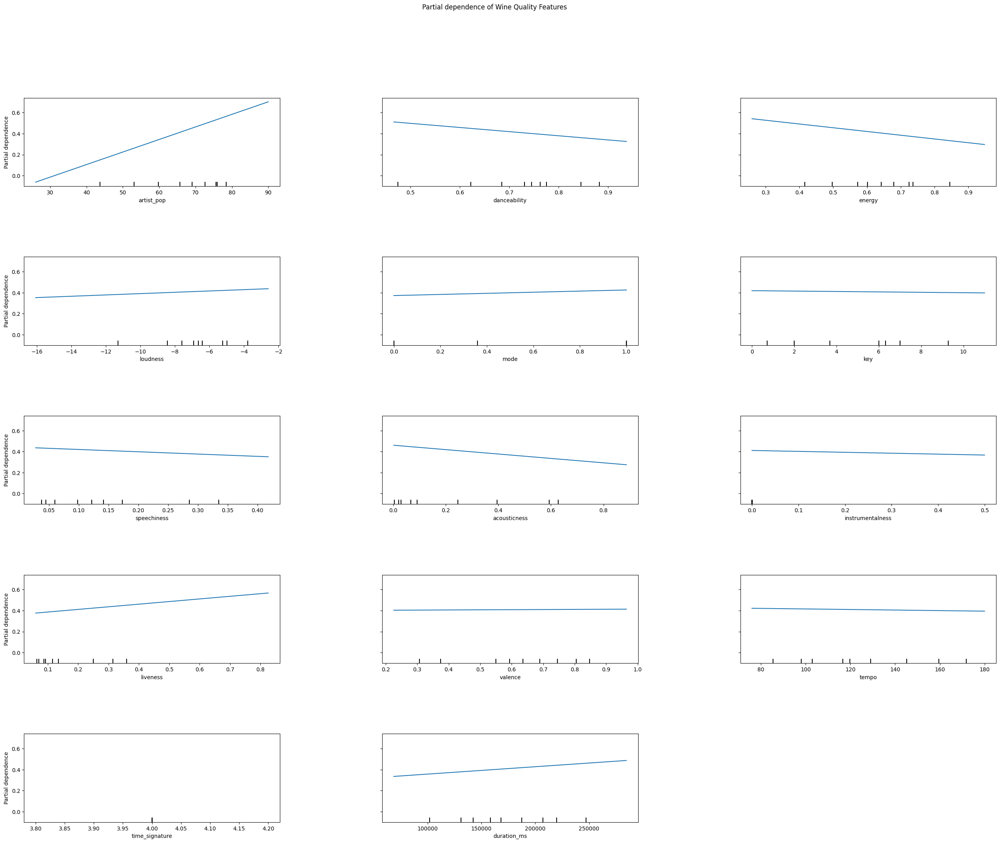

In [101]:
# PDP Plot for Linear Model

PartialDependenceDisplay.from_estimator(linear_model, x_test, x_test.columns) 
fig = plt.gcf()
fig.suptitle("Partial dependence of Wine Quality Features")
fig.subplots_adjust(wspace=0.4, hspace=0.8)
plt.show()
plt.rcParams["figure.figsize"] = (32, 24)

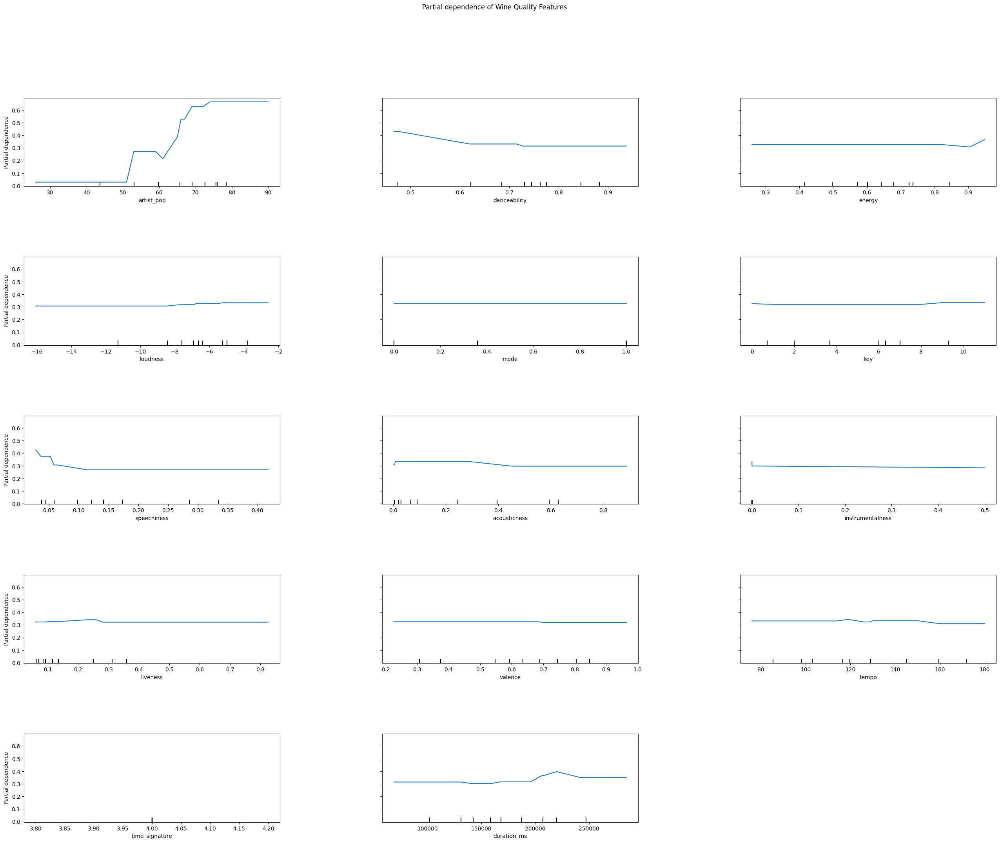

In [102]:
PartialDependenceDisplay.from_estimator(tree_model, x_test, x_test.columns)


fig = plt.gcf()
fig.suptitle("Partial dependence of Wine Quality Features")
fig.subplots_adjust(wspace=0.4, hspace=0.8)
plt.show()
plt.rcParams["figure.figsize"] = (32, 24)

#Comparison of partial dependence plot analysis, LIME, and SHAP:


Partial dependence plot analysis (PDPA), SHAP, and LIME comparison
Instead of using LIME, SHAP determines the marginal contribution of each feature to the prediction. The importance of each attribute is then assessed using Shapley values, a game theory concept with a strong theoretical foundation. This is where SHAP surpasses LIME due to its higher stability and lack of local linear model assumptions.
- PDP displays how much of an effect a particular variable has on the result by freezing the other variables.
- SHAP displays the contribution of each variable to the forecast.
- LIME is a lighter variation of SHAP and is more similar to it. It provides information using the vicinity of the point of interest

To choose the most appropriate interpretable approach for the ML model, we must first examine our needs and then weigh the trade offs.

# References

- https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Model_Interpretability/SHAP%20and%20LIME%20analysis%20Walkthrough.ipynb

- https://github.com/ajhalthor/model-interpretability/blob/main/Shap%20Values.ipynb

- https://towardsdatascience.com/model-interpretability-and-explainability-27fe31cc0688

- https://www.kaggle.com/code/parulpandey/intrepreting-machine-learning-models/notebook

-  https://realpython.com/linear-regression-in-python/

- https://towardsdatascience.com/understanding-decision-trees-for-regression-8d85f19c123d

-  https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d